Number of images: 622
Number of masks : 623
Missing mask pairs: 0


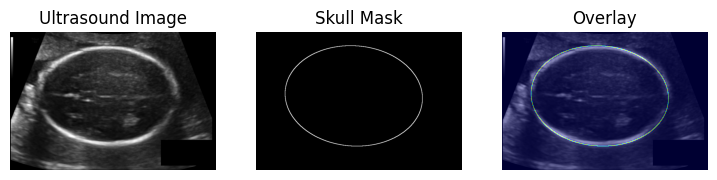

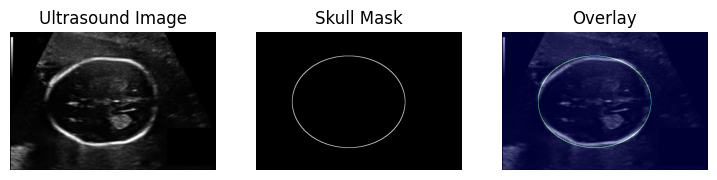

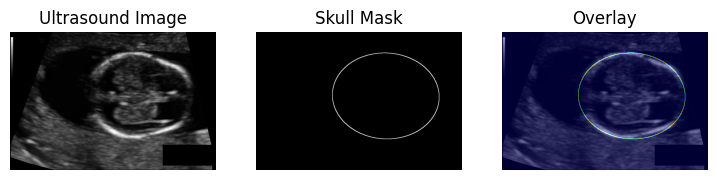

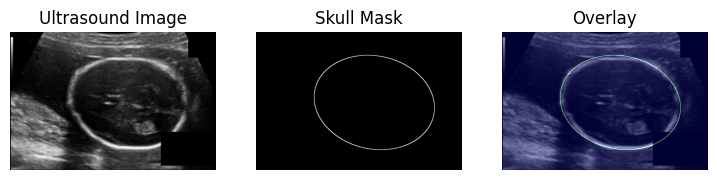

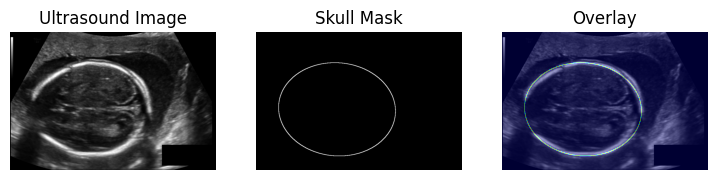

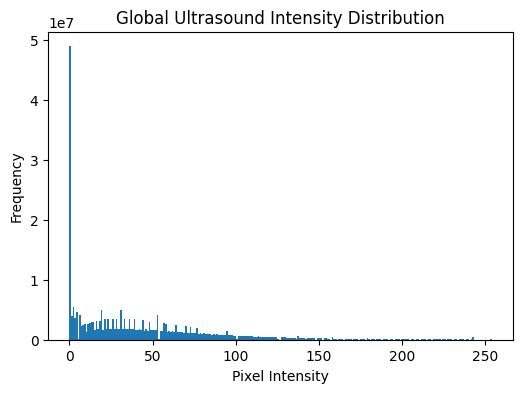

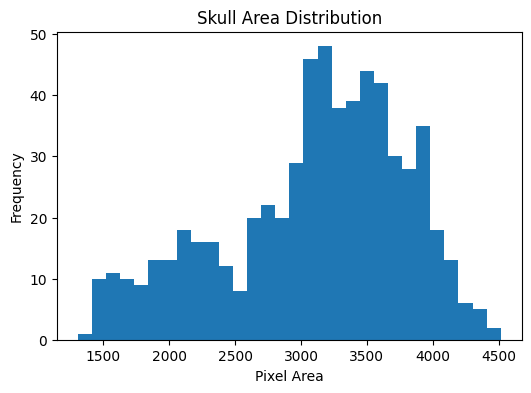

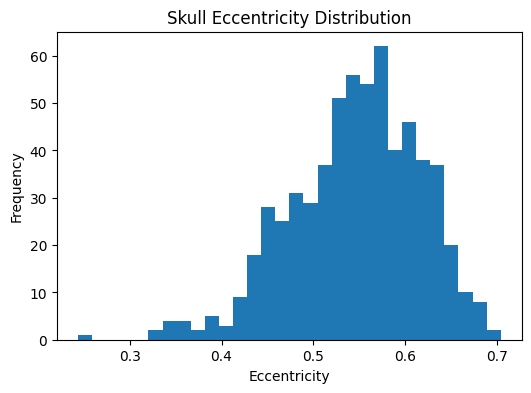

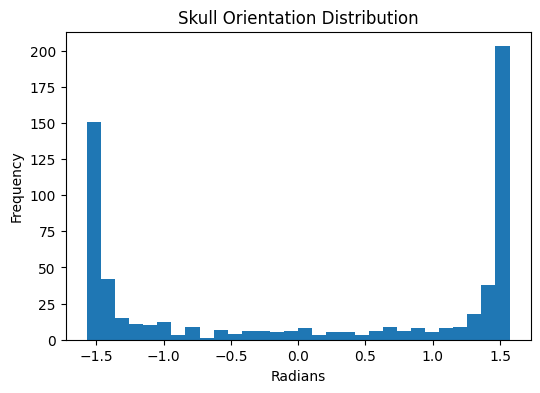

In [2]:
# ============================================================
# SECTION 1: EXPLORATORY DATA ANALYSIS (EDA)
# ============================================================

import os
import glob
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops, label

# ------------------------------------------------------------
# 1. Dataset paths
# ------------------------------------------------------------
IMAGE_DIR = "/kaggle/input/taskb-segmen/Task - Segmentation/images"
MASK_DIR = "/kaggle/input/taskb-segmen/Task - Segmentation/masks"

image_files = sorted(glob.glob(os.path.join(IMAGE_DIR, "*")))
mask_files = sorted(glob.glob(os.path.join(MASK_DIR, "*")))

print("Number of images:", len(image_files))
print("Number of masks :", len(mask_files))

# ------------------------------------------------------------
# 2. Verify image-mask pairing
# ------------------------------------------------------------
def image_to_mask_path(image_path):
    base = os.path.basename(image_path)
    name, _ = os.path.splitext(base)
    return os.path.join(MASK_DIR, f"{name}_Annotation.png")

missing = []
for img in image_files:
    if not os.path.exists(image_to_mask_path(img)):
        missing.append(img)

print("Missing mask pairs:", len(missing))

# ------------------------------------------------------------
# 3. Visual inspection of random samples
# ------------------------------------------------------------
def visualize_samples(image_paths, n=5):
    samples = random.sample(image_paths, n)

    for img_path in samples:
        mask_path = image_to_mask_path(img_path)

        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        plt.figure(figsize=(9, 3))

        plt.subplot(1, 3, 1)
        plt.title("Ultrasound Image")
        plt.imshow(img, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.title("Skull Mask")
        plt.imshow(mask, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.title("Overlay")
        plt.imshow(img, cmap="gray")
        plt.imshow(mask, cmap="jet", alpha=0.4)
        plt.axis("off")

        plt.show()

visualize_samples(image_files, n=5)

# ------------------------------------------------------------
# 4. Image intensity distribution analysis
# ------------------------------------------------------------
all_pixels = []

for img_path in image_files:
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    all_pixels.append(img.flatten())

all_pixels = np.concatenate(all_pixels)

plt.figure(figsize=(6, 4))
plt.hist(all_pixels, bins=256)
plt.title("Global Ultrasound Intensity Distribution")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

# ------------------------------------------------------------
# 5. Mask morphology analysis
# ------------------------------------------------------------
areas = []
eccentricities = []
orientations = []

for img_path in image_files:
    mask = cv2.imread(image_to_mask_path(img_path), cv2.IMREAD_GRAYSCALE)
    mask = (mask > 0).astype(np.uint8)

    labels = label(mask)
    regions = regionprops(labels)

    if len(regions) != 1:
        continue

    r = regions[0]
    areas.append(r.area)
    eccentricities.append(r.eccentricity)
    orientations.append(r.orientation)

# ------------------------------------------------------------
# 6. Plot skull area distribution
# ------------------------------------------------------------
plt.figure(figsize=(6, 4))
plt.hist(areas, bins=30)
plt.title("Skull Area Distribution")
plt.xlabel("Pixel Area")
plt.ylabel("Frequency")
plt.show()

# ------------------------------------------------------------
# 7. Plot eccentricity distribution (ellipse validity)
# ------------------------------------------------------------
plt.figure(figsize=(6, 4))
plt.hist(eccentricities, bins=30)
plt.title("Skull Eccentricity Distribution")
plt.xlabel("Eccentricity")
plt.ylabel("Frequency")
plt.show()

# ------------------------------------------------------------
# 8. Plot orientation distribution
# ------------------------------------------------------------
plt.figure(figsize=(6, 4))
plt.hist(orientations, bins=30)
plt.title("Skull Orientation Distribution")
plt.xlabel("Radians")
plt.ylabel("Frequency")
plt.show()


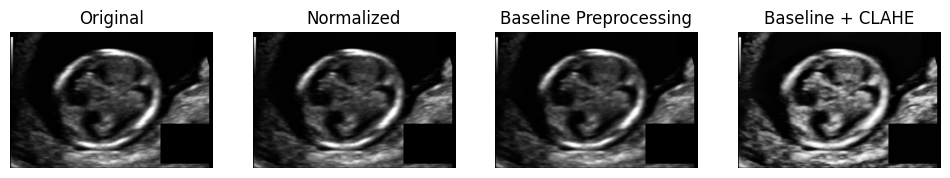

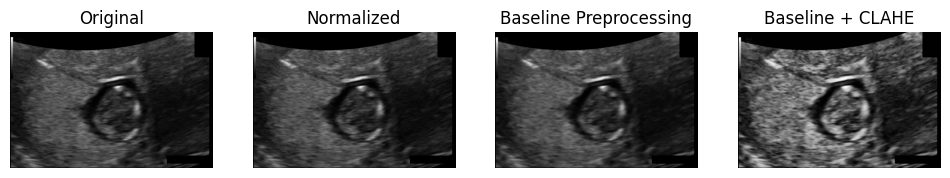

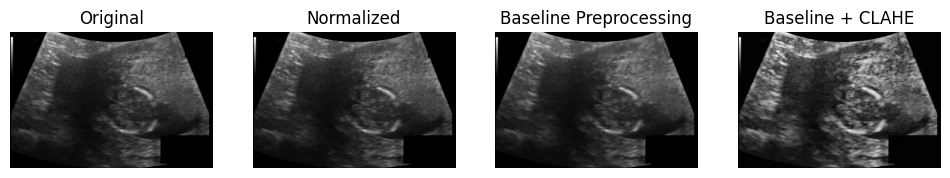

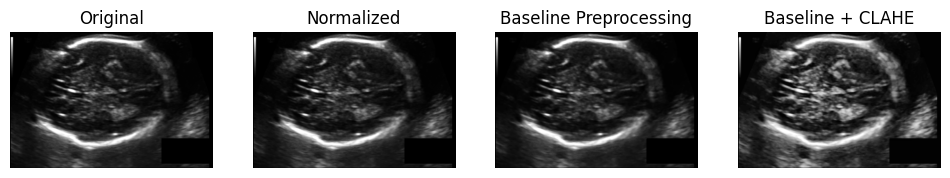

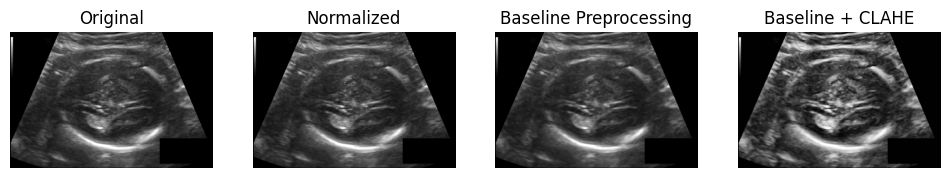

In [4]:
# ============================================================
# SECTION 2 (EXTENDED): PREPROCESSING WITH CLAHE (VISUAL TEST)
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# ------------------------------------------------------------
# 1. Baseline preprocessing (from previous section)
# ------------------------------------------------------------

def normalize_image(img):
    img = img.astype(np.float32)
    min_val = img.min()
    max_val = img.max()
    if max_val > min_val:
        img = (img - min_val) / (max_val - min_val)
    else:
        img = np.zeros_like(img)
    return img


def denoise_image(img):
    img_uint8 = (img * 255).astype(np.uint8)
    img_denoised = cv2.medianBlur(img_uint8, 5)
    img_denoised = img_denoised.astype(np.float32) / 255.0
    return img_denoised


def preprocess_baseline(img):
    img = normalize_image(img)
    img = denoise_image(img)
    return img


# ------------------------------------------------------------
# 2. CLAHE preprocessing
# ------------------------------------------------------------

def apply_clahe(img, clip_limit=2.0, tile_grid_size=(8, 8)):
    """
    Apply CLAHE on normalized image
    """
    img_uint8 = (img * 255).astype(np.uint8)
    clahe = cv2.createCLAHE(
        clipLimit=clip_limit,
        tileGridSize=tile_grid_size
    )
    img_clahe = clahe.apply(img_uint8)
    img_clahe = img_clahe.astype(np.float32) / 255.0
    return img_clahe


def preprocess_with_clahe(img):
    img = normalize_image(img)
    img = denoise_image(img)
    img = apply_clahe(img)
    return img


# ------------------------------------------------------------
# 3. Visual comparison
# ------------------------------------------------------------

def visualize_clahe_comparison(image_paths, n=5):
    samples = random.sample(image_paths, n)

    for img_path in samples:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        img_norm = normalize_image(img)
        img_base = preprocess_baseline(img)
        img_clahe = preprocess_with_clahe(img)

        plt.figure(figsize=(12, 3))

        plt.subplot(1, 4, 1)
        plt.title("Original")
        plt.imshow(img, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 4, 2)
        plt.title("Normalized")
        plt.imshow(img_norm, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 4, 3)
        plt.title("Baseline Preprocessing")
        plt.imshow(img_base, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 4, 4)
        plt.title("Baseline + CLAHE")
        plt.imshow(img_clahe, cmap="gray")
        plt.axis("off")

        plt.show()


# ------------------------------------------------------------
# 4. Run visual comparison
# ------------------------------------------------------------
visualize_clahe_comparison(image_files, n=5)


Training samples  : 497
Validation samples: 125
Image batch shape: torch.Size([8, 1, 256, 256])
Mask batch shape : torch.Size([8, 1, 256, 256])
Image min/max   : 0.0 1.0
Mask values     : tensor([0., 1.])


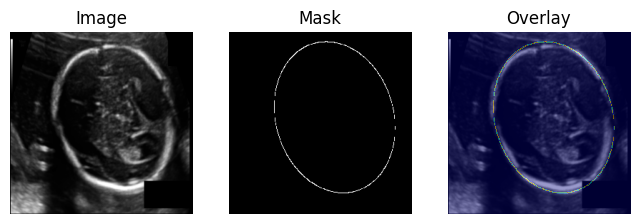

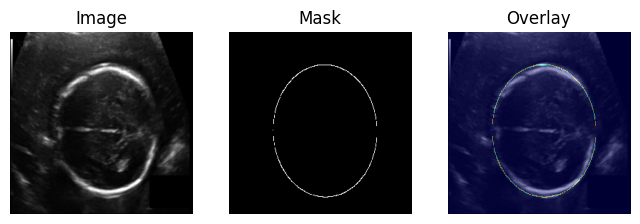

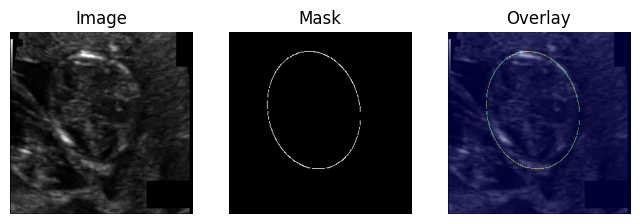

In [19]:
# ============================================================
# SECTION 3: DATASET PREPARATION (BASELINE)
# ============================================================

import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

# ------------------------------------------------------------
# 1. Configuration
# ------------------------------------------------------------
IMAGE_SIZE = 256   # baseline resolution
BATCH_SIZE = 8
RANDOM_SEED = 42

def preprocess_minimal(img):
    return normalize_image(img)

# ------------------------------------------------------------
# 2. Resize utilities
# ------------------------------------------------------------
def resize_image(img, size):
    return cv2.resize(img, (size, size), interpolation=cv2.INTER_AREA)

def resize_mask(mask, size):
    return cv2.resize(mask, (size, size), interpolation=cv2.INTER_NEAREST)

# ------------------------------------------------------------
# 3. Preprocessing wrapper
# ------------------------------------------------------------
def preprocess_pair(img_path, size):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(image_to_mask_path(img_path), cv2.IMREAD_GRAYSCALE)
    img = preprocess_minimal(img)
    #img = preprocess_baseline(img)
    mask = preprocess_mask(mask)

    img = resize_image(img, size)
    mask = resize_mask(mask, size)

    return img, mask

# ------------------------------------------------------------
# 4. Train / validation split
# ------------------------------------------------------------
train_files, val_files = train_test_split(
    image_files,
    test_size=0.2,
    random_state=RANDOM_SEED,
    shuffle=True
)

print("Training samples  :", len(train_files))
print("Validation samples:", len(val_files))

# ------------------------------------------------------------
# 5. PyTorch Dataset
# ------------------------------------------------------------
class SkullDataset(Dataset):
    def __init__(self, image_paths, size):
        self.image_paths = image_paths
        self.size = size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]

        img, mask = preprocess_pair(img_path, self.size)

        img = np.expand_dims(img, axis=0)
        mask = np.expand_dims(mask, axis=0)

        img = torch.tensor(img, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.float32)

        return img, mask

# ------------------------------------------------------------
# 6. DataLoaders
# ------------------------------------------------------------
train_dataset = SkullDataset(train_files, IMAGE_SIZE)
val_dataset = SkullDataset(val_files, IMAGE_SIZE)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

# ------------------------------------------------------------
# 7. Sanity check batch
# ------------------------------------------------------------
imgs, masks = next(iter(train_loader))

print("Image batch shape:", imgs.shape)
print("Mask batch shape :", masks.shape)
print("Image min/max   :", imgs.min().item(), imgs.max().item())
print("Mask values     :", torch.unique(masks))

# ------------------------------------------------------------
# 8. Visual sanity check
# ------------------------------------------------------------
import matplotlib.pyplot as plt

def visualize_batch(images, masks, n=3):
    for i in range(n):
        img = images[i, 0].numpy()
        mask = masks[i, 0].numpy()

        plt.figure(figsize=(8, 3))

        plt.subplot(1, 3, 1)
        plt.title("Image")
        plt.imshow(img, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.title("Mask")
        plt.imshow(mask, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.title("Overlay")
        plt.imshow(img, cmap="gray")
        plt.imshow(mask, cmap="jet", alpha=0.4)
        plt.axis("off")

        plt.show()

visualize_batch(imgs, masks, n=3)


In [21]:
# ============================================================
# UPDATED SECTION 4: U-NET (LOGITS OUTPUT)
# ============================================================

import torch
import torch.nn as nn

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.block(x)


class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x):
        return self.conv(self.pool(x))


class Up(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size(2) - x1.size(2)
        diffX = x2.size(3) - x1.size(3)

        x1 = nn.functional.pad(
            x1,
            [diffX // 2, diffX - diffX // 2,
             diffY // 2, diffY - diffY // 2]
        )
        return self.conv(torch.cat([x2, x1], dim=1))


class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.inc = DoubleConv(1, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 512)

        self.up1 = Up(1024, 256)
        self.up2 = Up(512, 128)
        self.up3 = Up(256, 64)
        self.up4 = Up(128, 64)

        self.outc = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)

        return self.outc(x)  # LOGITS, NO SIGMOID


In [22]:
# ============================================================
# CLASS IMBALANCE DIAGNOSTIC
# ============================================================

total_pixels = 0
foreground_pixels = 0

for img_path in train_files:
    _, mask = preprocess_pair(img_path, IMAGE_SIZE)
    total_pixels += mask.size
    foreground_pixels += mask.sum()

foreground_ratio = foreground_pixels / total_pixels

print("Foreground ratio:", foreground_ratio)
print("Background ratio:", 1 - foreground_ratio)

pos_weight = torch.tensor(
    (total_pixels - foreground_pixels) / foreground_pixels,
    dtype=torch.float32
).to(device)

print("Positive class weight:", pos_weight.item())


Foreground ratio: 0.007134850116322937
Background ratio: 0.992865149883677
Positive class weight: 139.15711975097656


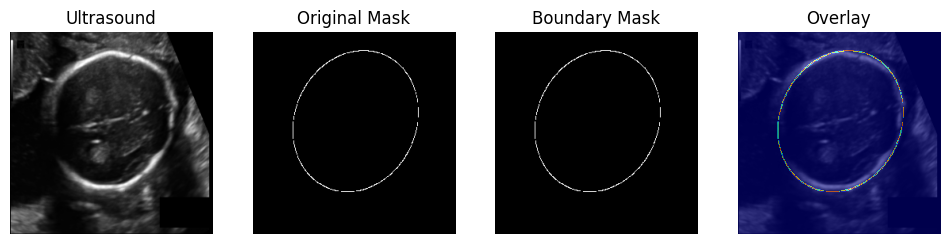

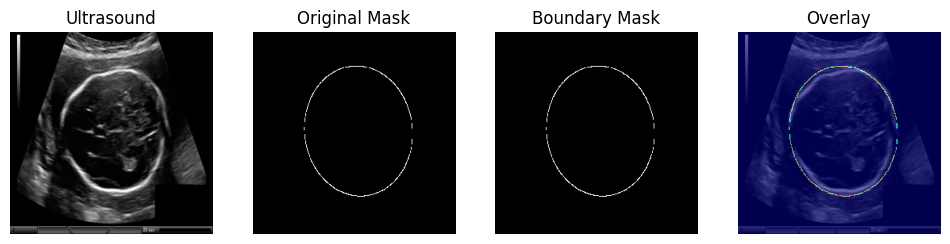

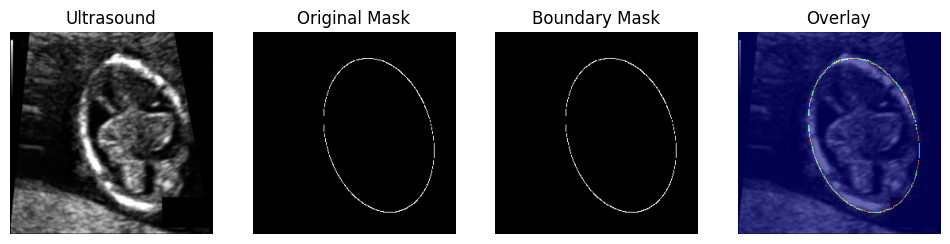

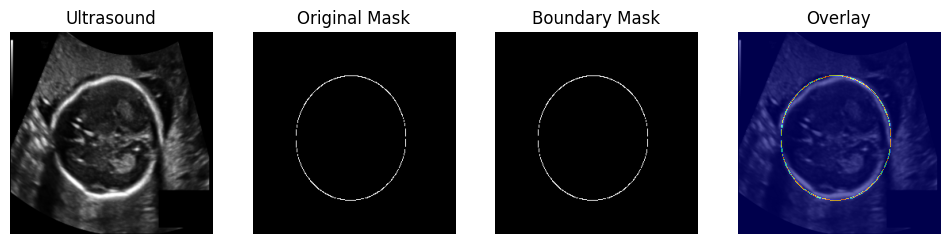

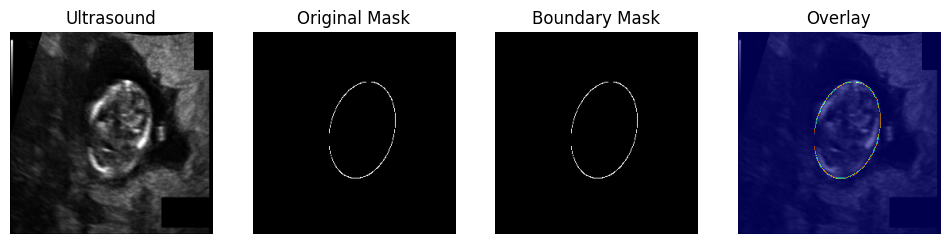

In [29]:
# ============================================================
# SECTION 3.5: BOUNDARY MASK GENERATION (BASELINE)
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# ------------------------------------------------------------
# 1. Boundary extraction function
# ------------------------------------------------------------

def mask_to_boundary(mask, thickness=1):
    """
    Convert a filled binary mask to a boundary-only mask.

    mask: binary numpy array {0,1}
    thickness: boundary thickness in pixels
    """
    mask = (mask > 0).astype(np.uint8)

    # Find contours
    contours, _ = cv2.findContours(
        mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_NONE
    )

    boundary = np.zeros_like(mask)

    for cnt in contours:
        cv2.drawContours(
            boundary,
            [cnt],
            contourIdx=-1,
            color=1,
            thickness=thickness
        )

    return boundary


# ------------------------------------------------------------
# 2. Visual validation of boundary masks
# ------------------------------------------------------------

def visualize_boundary_masks(image_paths, n=5, thickness=1):
    samples = random.sample(image_paths, n)

    for img_path in samples:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(image_to_mask_path(img_path), cv2.IMREAD_GRAYSCALE)

        img_n = resize_image(normalize_image(img), IMAGE_SIZE)
        mask_r = resize_mask(preprocess_mask(mask), IMAGE_SIZE)

        boundary = mask_to_boundary(mask_r, thickness=thickness)

        plt.figure(figsize=(12, 3))

        plt.subplot(1, 4, 1)
        plt.title("Ultrasound")
        plt.imshow(img_n, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 4, 2)
        plt.title("Original Mask")
        plt.imshow(mask_r, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 4, 3)
        plt.title("Boundary Mask")
        plt.imshow(boundary, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 4, 4)
        plt.title("Overlay")
        plt.imshow(img_n, cmap="gray")
        plt.imshow(boundary, cmap="jet", alpha=0.6)
        plt.axis("off")

        plt.show()


# ------------------------------------------------------------
# 3. Run boundary visualization
# ------------------------------------------------------------
visualize_boundary_masks(train_files, n=5, thickness=1)


In [24]:
# ============================================================
# UPDATED SECTION 5: BASELINE TRAINING (FIXED)
# ============================================================

import os
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Experiment config
# ------------------------------------------------------------

EXPERIMENT_NAME = "baseline_unet"
MODEL_DIR = "models"
MODEL_PATH = os.path.join(MODEL_DIR, f"{EXPERIMENT_NAME}.pt")
os.makedirs(MODEL_DIR, exist_ok=True)

EPOCHS = 100
LR = 1e-4

# ------------------------------------------------------------
# Loss: BCEWithLogits + Dice
# ------------------------------------------------------------

bce_loss = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

def dice_loss_from_logits(logits, targets, smooth=1.0):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    return 1.0 - (2.0 * intersection + smooth) / (union + smooth)


def combined_loss(logits, targets):
    bce = bce_loss(logits, targets)
    dice = dice_loss_from_logits(logits, targets).mean()
    return 0.5 * bce + 0.5 * dice


def dice_metric_soft(logits, targets):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    return ((2.0 * intersection + 1.0) / (union + 1.0)).mean()


# ------------------------------------------------------------
# Optimizer
# ------------------------------------------------------------

optimizer = torch.optim.Adam(model.parameters(), lr=LR)

# ------------------------------------------------------------
# Training loop with debugging
# ------------------------------------------------------------

best_val_dice = 0.0
history = {"train_dice": [], "val_dice": []}

for epoch in range(EPOCHS):
    model.train()
    train_dice = 0.0

    for imgs, masks in train_loader:
        imgs, masks = imgs.to(device), masks.to(device)

        optimizer.zero_grad()
        logits = model(imgs)
        loss = combined_loss(logits, masks)
        loss.backward()
        optimizer.step()

        train_dice += dice_metric_soft(logits, masks).item()

    train_dice /= len(train_loader)

    # Validation
    model.eval()
    val_dice = 0.0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            logits = model(imgs)
            val_dice += dice_metric_soft(logits, masks).item()

    val_dice /= len(val_loader)

    history["train_dice"].append(train_dice)
    history["val_dice"].append(val_dice)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Dice: {train_dice:.4f} | Val Dice: {val_dice:.4f}"
    )

    # Save best model
    if val_dice > best_val_dice:
        best_val_dice = val_dice
        torch.save(model.state_dict(), MODEL_PATH)
        print("✓ Saved best model")

print("Best Validation Dice:", best_val_dice)


Epoch [1/30] | Train Dice: 0.0353 | Val Dice: 0.0317
✓ Saved best model
Epoch [2/30] | Train Dice: 0.0323 | Val Dice: 0.0319
✓ Saved best model
Epoch [3/30] | Train Dice: 0.0366 | Val Dice: 0.0335
✓ Saved best model
Epoch [4/30] | Train Dice: 0.0403 | Val Dice: 0.0361
✓ Saved best model
Epoch [5/30] | Train Dice: 0.0428 | Val Dice: 0.0376
✓ Saved best model
Epoch [6/30] | Train Dice: 0.0459 | Val Dice: 0.0414
✓ Saved best model
Epoch [7/30] | Train Dice: 0.0519 | Val Dice: 0.0526
✓ Saved best model
Epoch [8/30] | Train Dice: 0.0636 | Val Dice: 0.0464
Epoch [9/30] | Train Dice: 0.0699 | Val Dice: 0.0708
✓ Saved best model
Epoch [10/30] | Train Dice: 0.0783 | Val Dice: 0.0728
✓ Saved best model
Epoch [11/30] | Train Dice: 0.0836 | Val Dice: 0.0740
✓ Saved best model
Epoch [12/30] | Train Dice: 0.0903 | Val Dice: 0.0940
✓ Saved best model
Epoch [13/30] | Train Dice: 0.0940 | Val Dice: 0.0838
Epoch [14/30] | Train Dice: 0.0929 | Val Dice: 0.1026
✓ Saved best model
Epoch [15/30] | Train Dic

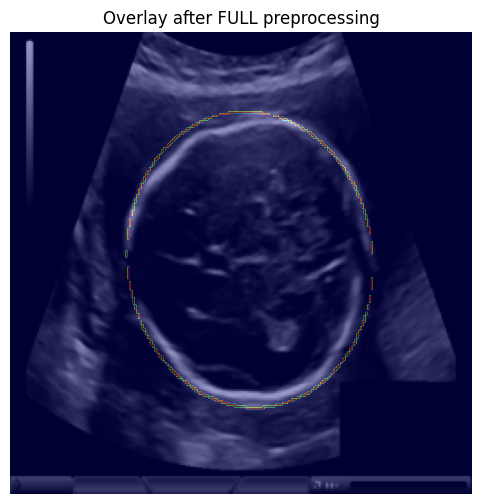

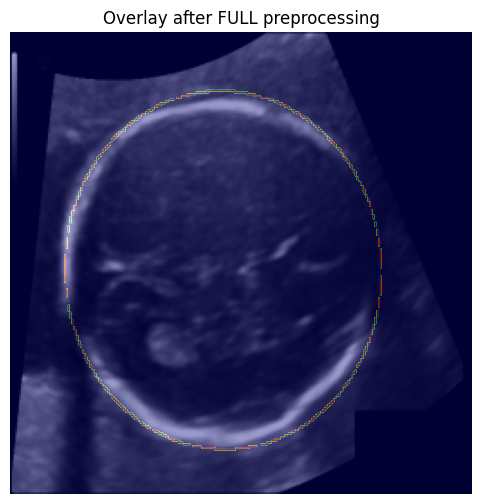

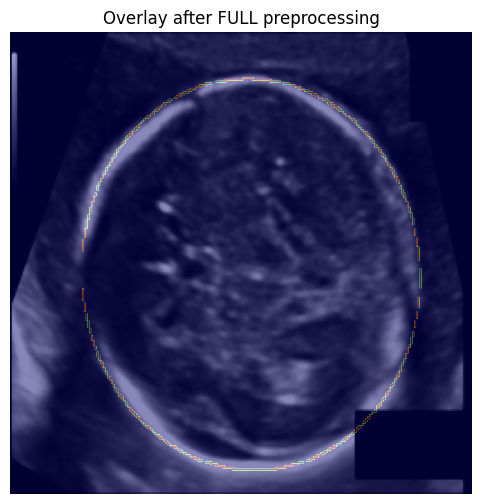

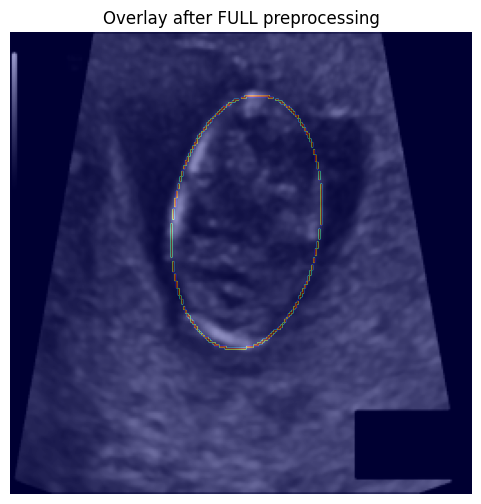

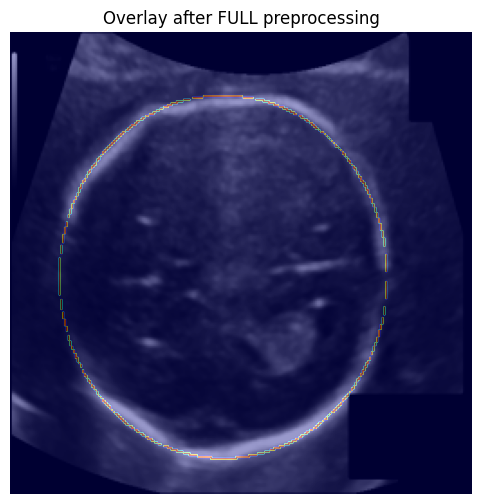

In [28]:
# ============================================================
# DEBUG 1: VERIFY IMAGE–MASK ALIGNMENT
# ============================================================

import random
import matplotlib.pyplot as plt

def debug_alignment(image_paths, n=5):
    samples = random.sample(image_paths, n)

    for img_path in samples:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(image_to_mask_path(img_path), cv2.IMREAD_GRAYSCALE)

        img_p = preprocess_baseline(img)
        mask_p = preprocess_mask(mask)

        img_r = resize_image(img_p, IMAGE_SIZE)
        mask_r = resize_mask(mask_p, IMAGE_SIZE)

        plt.figure(figsize=(6, 6))
        plt.imshow(img_r, cmap="gray")
        plt.imshow(mask_r, cmap="jet", alpha=0.4)
        plt.title("Overlay after FULL preprocessing")
        plt.axis("off")
        plt.show()

debug_alignment(train_files, n=5)


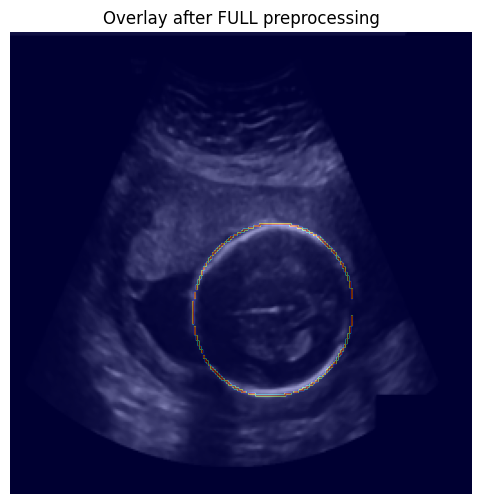

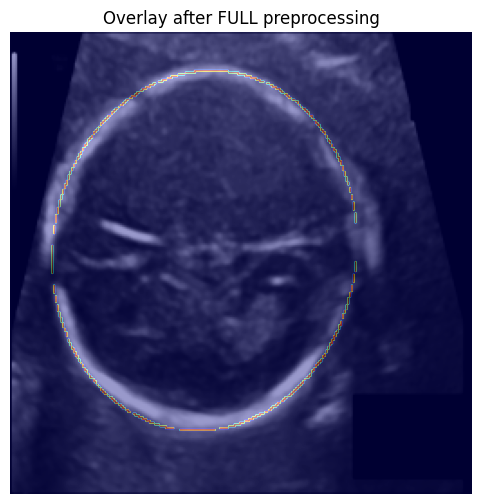

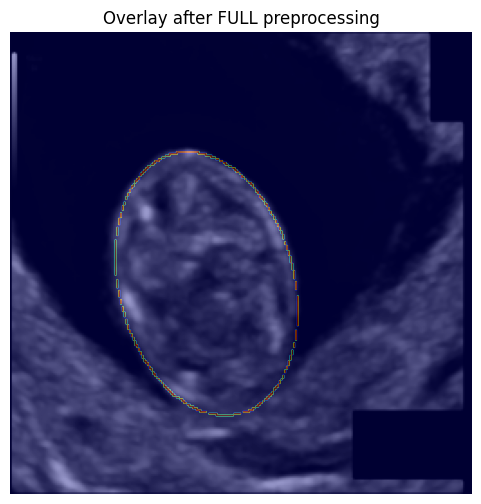

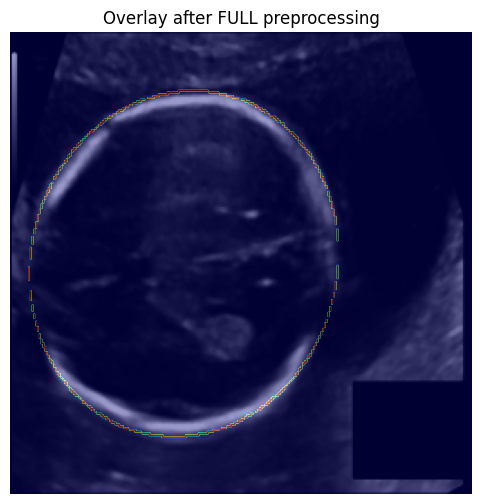

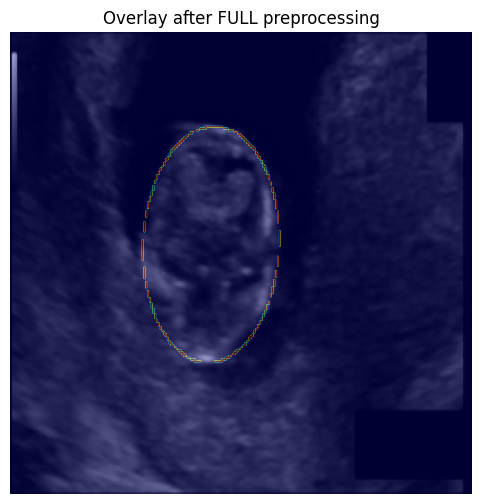

Starting baseline training with boundary masks...
Epoch [1/30] | Train Dice: 0.0190 | Val Dice: 0.0244
✓ Saved best model to models/baseline_boundary_unet.pt
Epoch [2/30] | Train Dice: 0.0258 | Val Dice: 0.0267
✓ Saved best model to models/baseline_boundary_unet.pt
Epoch [3/30] | Train Dice: 0.0274 | Val Dice: 0.0279
✓ Saved best model to models/baseline_boundary_unet.pt
Epoch [4/30] | Train Dice: 0.0341 | Val Dice: 0.0370
✓ Saved best model to models/baseline_boundary_unet.pt
Epoch [5/30] | Train Dice: 0.0404 | Val Dice: 0.0425
✓ Saved best model to models/baseline_boundary_unet.pt
Epoch [6/30] | Train Dice: 0.0447 | Val Dice: 0.0510
✓ Saved best model to models/baseline_boundary_unet.pt
Epoch [7/30] | Train Dice: 0.0476 | Val Dice: 0.0497
Epoch [8/30] | Train Dice: 0.0525 | Val Dice: 0.0474
Epoch [9/30] | Train Dice: 0.0679 | Val Dice: 0.0825
✓ Saved best model to models/baseline_boundary_unet.pt
Epoch [10/30] | Train Dice: 0.0859 | Val Dice: 0.0872
✓ Saved best model to models/basel

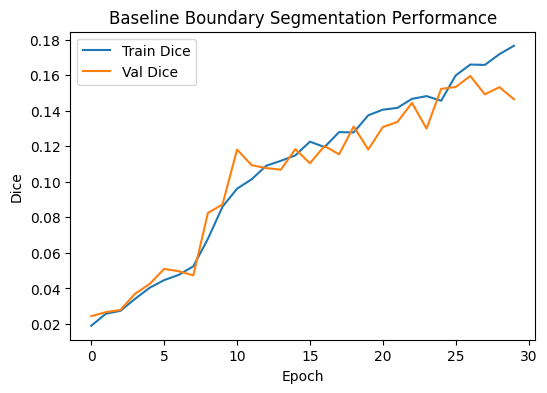

In [31]:
# ============================================================
# SECTION 5 (FINAL): BASELINE TRAINING WITH BOUNDARY MASKS
# ============================================================

import os
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Experiment configuration
# ------------------------------------------------------------

EXPERIMENT_NAME = "baseline_boundary_unet"
MODEL_DIR = "models"
MODEL_PATH = os.path.join(MODEL_DIR, f"{EXPERIMENT_NAME}.pt")

os.makedirs(MODEL_DIR, exist_ok=True)

EPOCHS = 30
LR = 1e-4
BATCH_SIZE = 8

# ------------------------------------------------------------
# 2. Datasets and DataLoaders
# ------------------------------------------------------------

train_dataset = SkullBoundaryDataset(
    train_files,
    IMAGE_SIZE,
    boundary_thickness=1
)

val_dataset = SkullBoundaryDataset(
    val_files,
    IMAGE_SIZE,
    boundary_thickness=1
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

# ------------------------------------------------------------
# 3. Model, optimizer, loss
# ------------------------------------------------------------

model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

bce_loss = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

def combined_loss(logits, targets):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    dice_loss = 1.0 - (2.0 * intersection + 1.0) / (union + 1.0)
    bce = bce_loss(logits, targets)
    return 0.5 * bce + 0.5 * dice_loss.mean()

def dice_metric_soft(logits, targets):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    return ((2.0 * intersection + 1.0) / (union + 1.0)).mean()

# ------------------------------------------------------------
# 4. Training loop with checkpointing
# ------------------------------------------------------------

best_val_dice = 0.0

history = {
    "train_dice": [],
    "val_dice": []
}

print("Starting baseline training with boundary masks...")

for epoch in range(EPOCHS):
    # Training
    model.train()
    train_dice = 0.0

    for imgs, masks in train_loader:
        imgs = imgs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        logits = model(imgs)
        loss = combined_loss(logits, masks)
        loss.backward()
        optimizer.step()

        train_dice += dice_metric_soft(logits, masks).item()

    train_dice /= len(train_loader)

    # Validation
    model.eval()
    val_dice = 0.0

    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs = imgs.to(device)
            masks = masks.to(device)

            logits = model(imgs)
            val_dice += dice_metric_soft(logits, masks).item()

    val_dice /= len(val_loader)

    history["train_dice"].append(train_dice)
    history["val_dice"].append(val_dice)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Dice: {train_dice:.4f} | Val Dice: {val_dice:.4f}"
    )

    # Save best model
    if val_dice > best_val_dice:
        best_val_dice = val_dice
        torch.save(model.state_dict(), MODEL_PATH)
        print(f"✓ Saved best model to {MODEL_PATH}")

print("\nBest Validation Dice:", best_val_dice)

# ------------------------------------------------------------
# 5. Plot Dice curves
# ------------------------------------------------------------

plt.figure(figsize=(6, 4))
plt.plot(history["train_dice"], label="Train Dice")
plt.plot(history["val_dice"], label="Val Dice")
plt.xlabel("Epoch")
plt.ylabel("Dice")
plt.title("Baseline Boundary Segmentation Performance")
plt.legend()
plt.show()


✓ Loaded baseline boundary model
Visualizing baseline predictions...


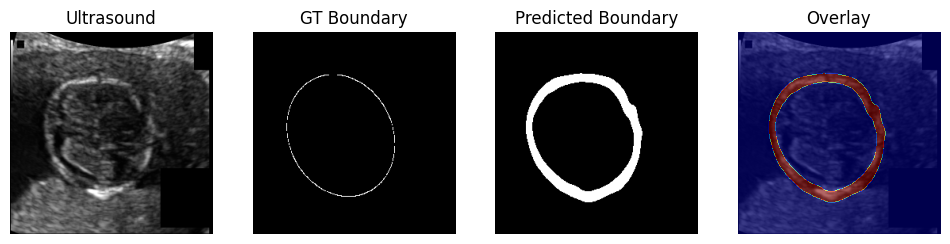

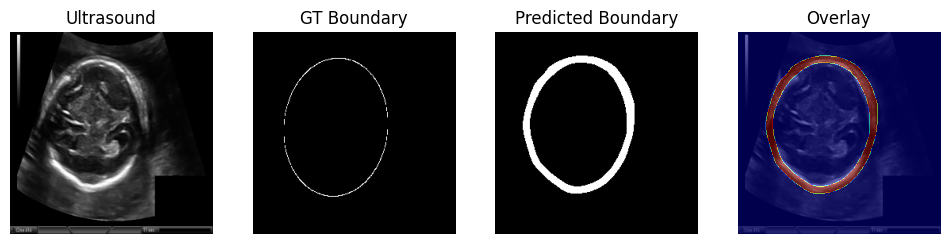

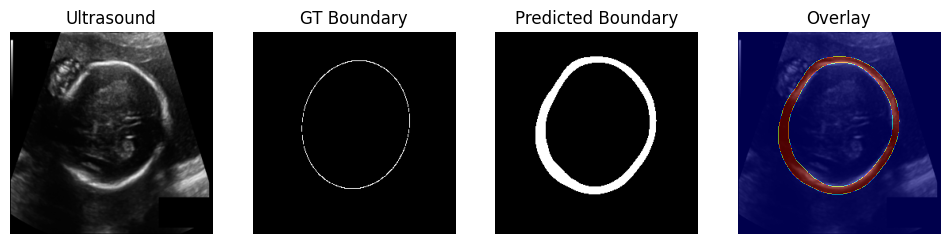

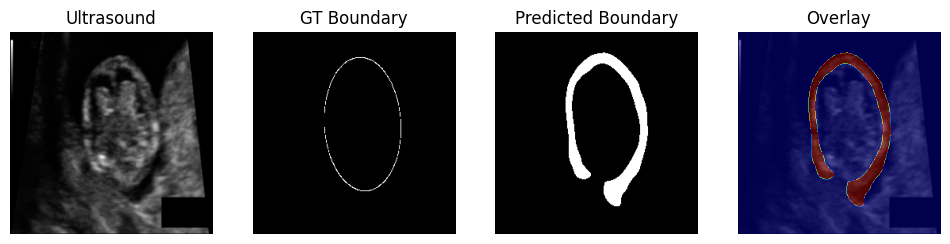

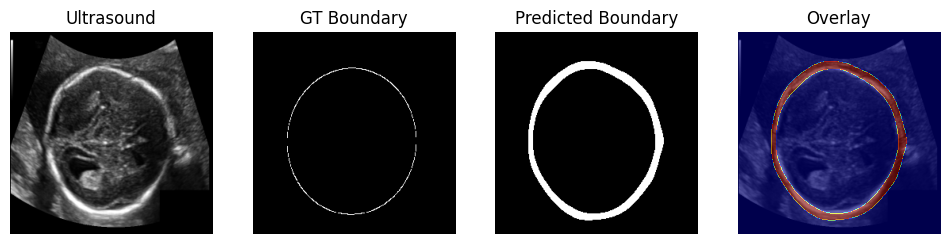

In [32]:
# ============================================================
# SECTION 6: BASELINE INFERENCE & QUALITATIVE EVALUATION
# ============================================================

import torch
import numpy as np
import matplotlib.pyplot as plt
import random

# ------------------------------------------------------------
# 1. Load trained baseline model
# ------------------------------------------------------------

MODEL_PATH = "models/baseline_boundary_unet.pt"

model = UNet().to(device)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.eval()

print("✓ Loaded baseline boundary model")

# ------------------------------------------------------------
# 2. Inference function
# ------------------------------------------------------------

def predict_boundary(model, img_np):
    """
    img_np: (H, W) normalized image
    returns: (H, W) probability map
    """
    img_tensor = torch.tensor(
        img_np, dtype=torch.float32
    ).unsqueeze(0).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(img_tensor)
        probs = torch.sigmoid(logits)

    return probs.squeeze().cpu().numpy()


# ------------------------------------------------------------
# 3. Visualization function
# ------------------------------------------------------------

def visualize_boundary_prediction(img_path, threshold=0.5):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(image_to_mask_path(img_path), cv2.IMREAD_GRAYSCALE)

    img = preprocess_image_minimal(img)
    img = resize_image(img, IMAGE_SIZE)

    gt_mask = resize_mask(preprocess_mask(mask), IMAGE_SIZE)
    gt_boundary = mask_to_boundary(gt_mask, thickness=1)

    prob = predict_boundary(model, img)
    pred_boundary = (prob > threshold).astype(np.uint8)

    plt.figure(figsize=(12, 3))

    plt.subplot(1, 4, 1)
    plt.title("Ultrasound")
    plt.imshow(img, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.title("GT Boundary")
    plt.imshow(gt_boundary, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.title("Predicted Boundary")
    plt.imshow(pred_boundary, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.title("Overlay")
    plt.imshow(img, cmap="gray")
    plt.imshow(pred_boundary, cmap="jet", alpha=0.6)
    plt.axis("off")

    plt.show()


# ------------------------------------------------------------
# 4. Run qualitative evaluation on validation samples
# ------------------------------------------------------------

print("Visualizing baseline predictions...")

for img_path in random.sample(val_files, 5):
    visualize_boundary_prediction(img_path, threshold=0.5)


Running geometry extraction on validation samples...


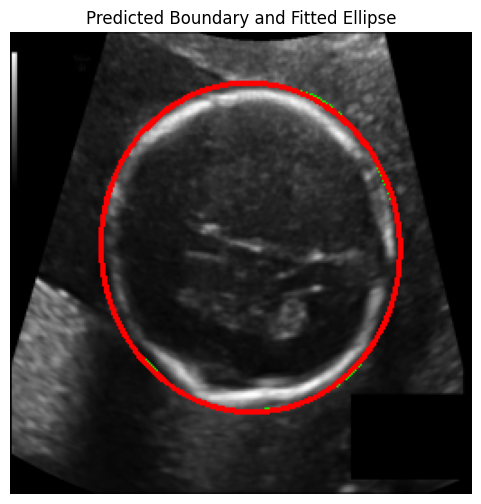

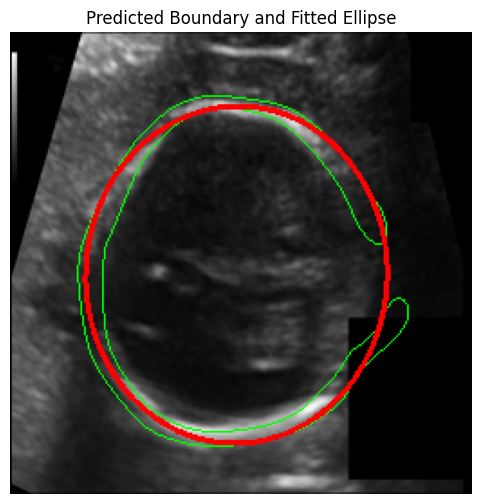

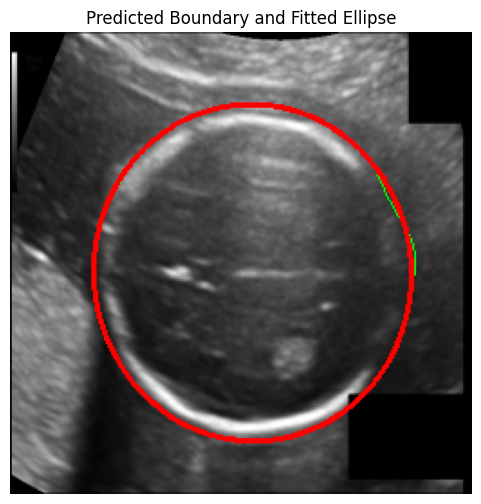

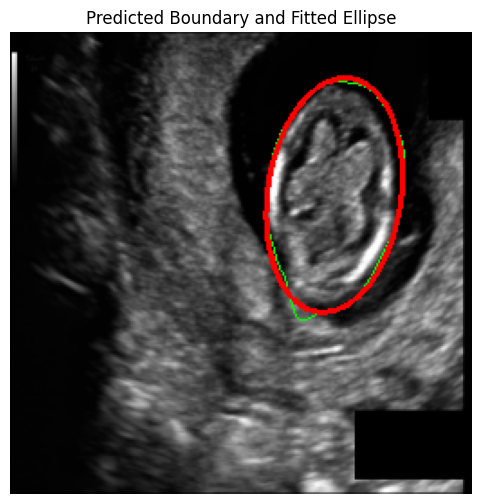

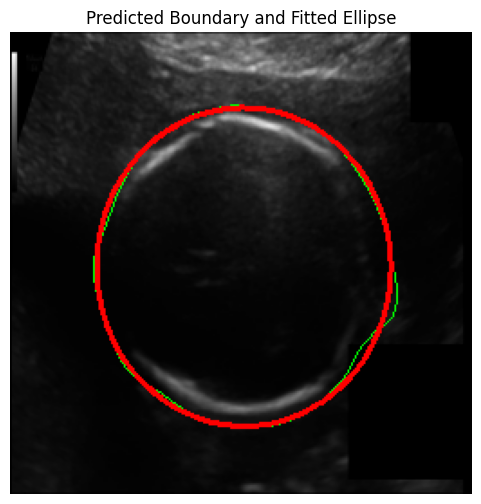

...

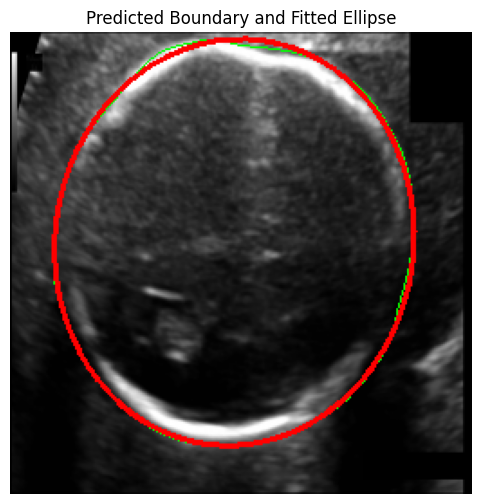

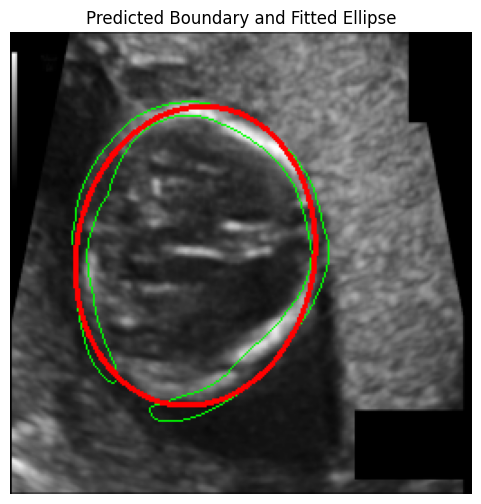

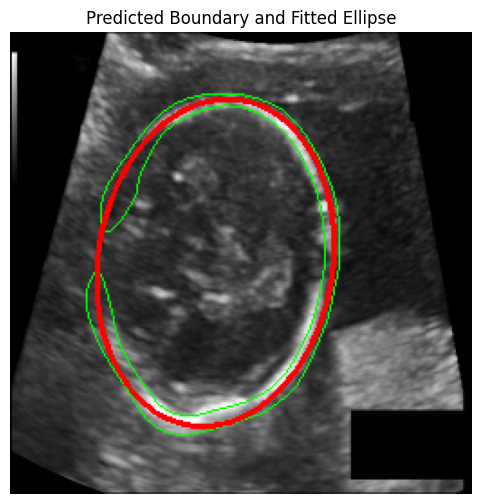

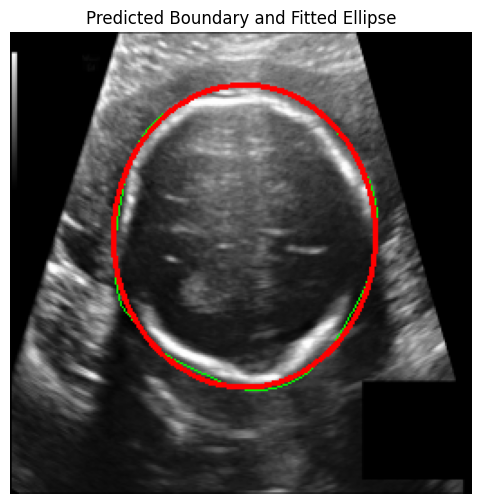

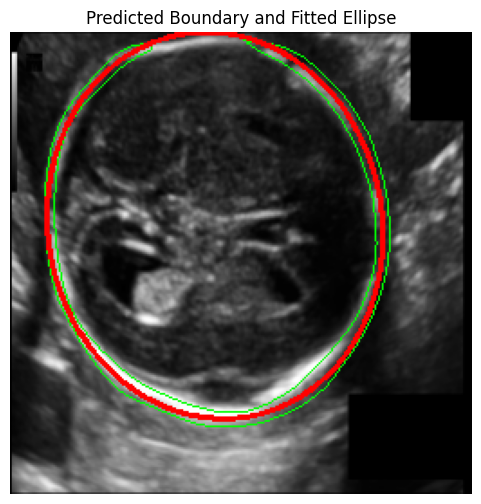

In [34]:
# ============================================================
# SECTION 7: GEOMETRY EXTRACTION AND ELLIPSE FITTING
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# ------------------------------------------------------------
# 1. Utility: largest contour selection
# ------------------------------------------------------------

def get_largest_contour(binary_mask):
    """
    Returns the largest contour by area.
    """
    contours, _ = cv2.findContours(
        binary_mask.astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_NONE
    )

    if len(contours) == 0:
        return None

    largest = max(contours, key=cv2.contourArea)
    return largest


# ------------------------------------------------------------
# 2. Ellipse fitting
# ------------------------------------------------------------

def fit_ellipse_to_contour(contour):
    """
    Fits an ellipse to a contour using OpenCV.
    Requires at least 5 points.
    """
    if contour is None or len(contour) < 5:
        return None
    ellipse = cv2.fitEllipse(contour)
    return ellipse


# ------------------------------------------------------------
# 3. Full inference + geometry pipeline
# ------------------------------------------------------------

def run_geometry_pipeline(img_path, threshold=0.5):
    # Load and preprocess image
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = preprocess_image_minimal(img)
    img = resize_image(img, IMAGE_SIZE)

    # Predict boundary probability
    prob = predict_boundary(model, img)
    binary = (prob > threshold).astype(np.uint8)

    # Extract contour
    contour = get_largest_contour(binary)

    # Fit ellipse
    ellipse = fit_ellipse_to_contour(contour)

    return img, binary, contour, ellipse


# ------------------------------------------------------------
# 4. Visualization
# ------------------------------------------------------------

def visualize_geometry(img, binary, contour, ellipse):
    canvas = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

    if contour is not None:
        cv2.drawContours(canvas, [contour], -1, (0, 255, 0), 1)

    if ellipse is not None:
        cv2.ellipse(canvas, ellipse, (255, 0, 0), 2)

    plt.figure(figsize=(6, 6))
    plt.imshow(canvas)
    plt.title("Predicted Boundary and Fitted Ellipse")
    plt.axis("off")
    plt.show()


# ------------------------------------------------------------
# 5. Run baseline geometry evaluation on validation samples
# ------------------------------------------------------------

print("Running geometry extraction on validation samples...")

for img_path in random.sample(val_files, 15):
    img, binary, contour, ellipse = run_geometry_pipeline(img_path)
    visualize_geometry(img, binary, contour, ellipse)


Extracting BPD and OFD landmarks on validation samples...


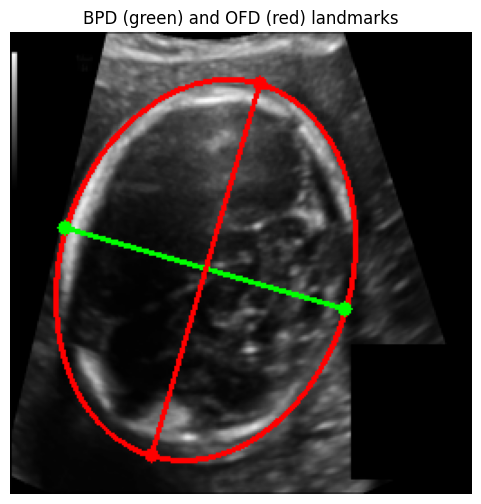

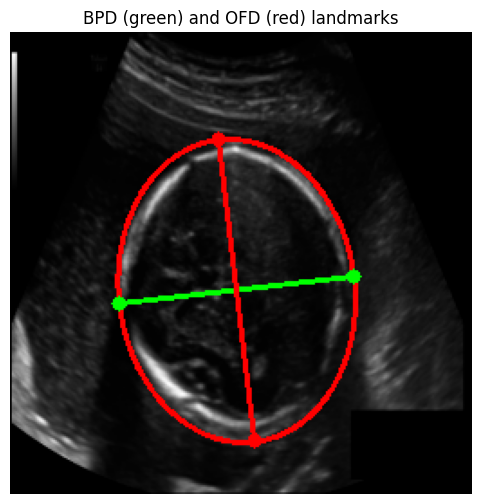

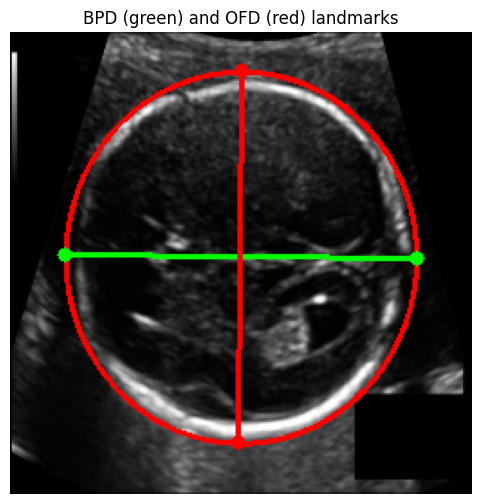

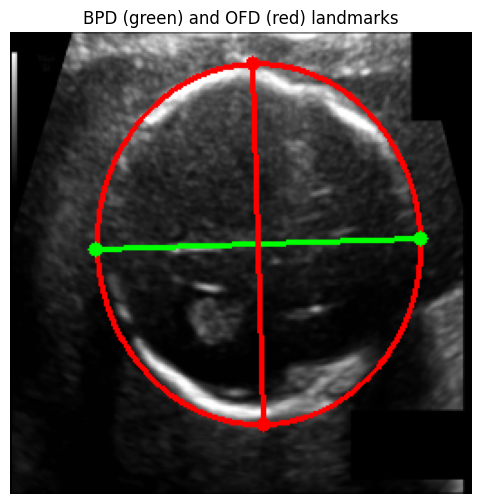

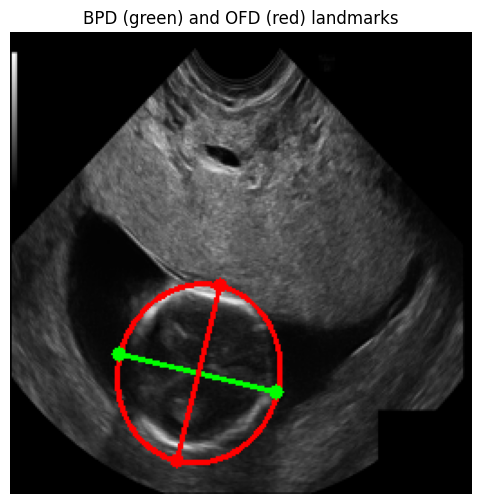

In [35]:
# ============================================================
# SECTION 8: BPD & OFD LANDMARK EXTRACTION
# ============================================================

import math

# ------------------------------------------------------------
# 1. Landmark extraction from ellipse
# ------------------------------------------------------------

def extract_bpd_ofd_landmarks(ellipse):
    """
    ellipse: output of cv2.fitEllipse
    returns:
        BPD points (2, 2)
        OFD points (2, 2)
    """
    (cx, cy), (width, height), angle = ellipse

    # Major and minor radii
    if width >= height:
        major_radius = width / 2.0
        minor_radius = height / 2.0
        major_angle = angle
    else:
        major_radius = height / 2.0
        minor_radius = width / 2.0
        major_angle = angle + 90.0

    # Convert to radians
    theta_major = np.deg2rad(major_angle)
    theta_minor = theta_major + np.pi / 2.0

    # OFD endpoints (major axis)
    ofd_p1 = (
        cx + major_radius * np.cos(theta_major),
        cy + major_radius * np.sin(theta_major)
    )
    ofd_p2 = (
        cx - major_radius * np.cos(theta_major),
        cy - major_radius * np.sin(theta_major)
    )

    # BPD endpoints (minor axis)
    bpd_p1 = (
        cx + minor_radius * np.cos(theta_minor),
        cy + minor_radius * np.sin(theta_minor)
    )
    bpd_p2 = (
        cx - minor_radius * np.cos(theta_minor),
        cy - minor_radius * np.sin(theta_minor)
    )

    return np.array([bpd_p1, bpd_p2]), np.array([ofd_p1, ofd_p2])


# ------------------------------------------------------------
# 2. Visualization
# ------------------------------------------------------------

def visualize_landmarks(img, ellipse, bpd_pts, ofd_pts):
    canvas = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

    # Draw ellipse
    cv2.ellipse(canvas, ellipse, (255, 0, 0), 2)

    # Draw BPD (green)
    cv2.line(
        canvas,
        tuple(bpd_pts[0].astype(int)),
        tuple(bpd_pts[1].astype(int)),
        (0, 255, 0),
        2
    )

    # Draw OFD (red)
    cv2.line(
        canvas,
        tuple(ofd_pts[0].astype(int)),
        tuple(ofd_pts[1].astype(int)),
        (255, 0, 0),
        2
    )

    # Draw landmark points
    for p in bpd_pts:
        cv2.circle(canvas, tuple(p.astype(int)), 4, (0, 255, 0), -1)
    for p in ofd_pts:
        cv2.circle(canvas, tuple(p.astype(int)), 4, (255, 0, 0), -1)

    plt.figure(figsize=(6, 6))
    plt.imshow(canvas)
    plt.title("BPD (green) and OFD (red) landmarks")
    plt.axis("off")
    plt.show()


# ------------------------------------------------------------
# 3. Run landmark extraction on validation samples
# ------------------------------------------------------------

print("Extracting BPD and OFD landmarks on validation samples...")

for img_path in random.sample(val_files, 5):
    img, binary, contour, ellipse = run_geometry_pipeline(img_path)

    if ellipse is None:
        print("Ellipse fitting failed, skipping sample")
        continue

    bpd_pts, ofd_pts = extract_bpd_ofd_landmarks(ellipse)
    visualize_landmarks(img, ellipse, bpd_pts, ofd_pts)


In [36]:
# ============================================================
# SECTION 9: BASELINE SANITY CHECKS
# ============================================================

import numpy as np

# ------------------------------------------------------------
# 1. Utility functions
# ------------------------------------------------------------

def distance(p1, p2):
    return np.linalg.norm(np.array(p1) - np.array(p2))


def angle_between(v1, v2):
    cos_angle = np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2) + 1e-8)
    return np.degrees(np.arccos(np.clip(cos_angle, -1.0, 1.0)))


# ------------------------------------------------------------
# 2. Sanity check evaluation
# ------------------------------------------------------------

results = {
    "valid_ellipse": 0,
    "bpd_less_than_ofd": 0,
    "axes_perpendicular": 0,
    "total": 0
}

failure_examples = []

for img_path in val_files:
    img, binary, contour, ellipse = run_geometry_pipeline(img_path)

    if ellipse is None:
        continue

    results["valid_ellipse"] += 1

    bpd_pts, ofd_pts = extract_bpd_ofd_landmarks(ellipse)

    bpd_length = distance(bpd_pts[0], bpd_pts[1])
    ofd_length = distance(ofd_pts[0], ofd_pts[1])

    # Check 1: BPD < OFD
    if bpd_length < ofd_length:
        results["bpd_less_than_ofd"] += 1

    # Check 2: Axes approximately perpendicular
    v_bpd = bpd_pts[1] - bpd_pts[0]
    v_ofd = ofd_pts[1] - ofd_pts[0]

    angle = angle_between(v_bpd, v_ofd)
    if abs(angle - 90) < 15:
        results["axes_perpendicular"] += 1

    # Track failures
    if not (bpd_length < ofd_length and abs(angle - 90) < 15):
        failure_examples.append(img_path)

    results["total"] += 1


# ------------------------------------------------------------
# 3. Report sanity check results
# ------------------------------------------------------------

print("Baseline sanity check results:\n")

for k, v in results.items():
    if k != "total":
        print(f"{k}: {v} / {results['total']}")

print("\nNumber of failure cases:", len(failure_examples))


Baseline sanity check results:

valid_ellipse: 125 / 125
bpd_less_than_ofd: 125 / 125
axes_perpendicular: 125 / 125

Number of failure cases: 0


In [37]:
# ============================================================
# HYPOTHESIS 1: HIGHER RESOLUTION (512x512)
# ============================================================

# ------------------------------------------------------------
# 1. Experiment configuration
# ------------------------------------------------------------

IMAGE_SIZE_H1 = 512

EXPERIMENT_NAME = "hyp1_highres_boundary_unet"
MODEL_DIR = "models"
MODEL_PATH = f"{MODEL_DIR}/{EXPERIMENT_NAME}.pt"

EPOCHS = 30
LR = 1e-4
BATCH_SIZE = 4  # reduced due to memory

# ------------------------------------------------------------
# 2. Datasets and loaders (unchanged logic)
# ------------------------------------------------------------

train_dataset_h1 = SkullBoundaryDataset(
    train_files,
    IMAGE_SIZE_H1,
    boundary_thickness=1
)

val_dataset_h1 = SkullBoundaryDataset(
    val_files,
    IMAGE_SIZE_H1,
    boundary_thickness=1
)

train_loader_h1 = DataLoader(
    train_dataset_h1,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

val_loader_h1 = DataLoader(
    val_dataset_h1,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

# ------------------------------------------------------------
# 3. Model, optimizer, loss (IDENTICAL)
# ------------------------------------------------------------

model_h1 = UNet().to(device)
optimizer_h1 = torch.optim.Adam(model_h1.parameters(), lr=LR)
bce_loss_h1 = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

def combined_loss_h1(logits, targets):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    dice_loss = 1.0 - (2.0 * intersection + 1.0) / (union + 1.0)
    bce = bce_loss_h1(logits, targets)
    return 0.5 * bce + 0.5 * dice_loss.mean()

def dice_metric_soft_h1(logits, targets):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    return ((2.0 * intersection + 1.0) / (union + 1.0)).mean()

# ------------------------------------------------------------
# 4. Training loop with checkpointing
# ------------------------------------------------------------

best_val_dice = 0.0
history_h1 = {"train_dice": [], "val_dice": []}

print("Training Hypothesis 1: High-resolution model...")

for epoch in range(EPOCHS):
    model_h1.train()
    train_dice = 0.0

    for imgs, masks in train_loader_h1:
        imgs, masks = imgs.to(device), masks.to(device)

        optimizer_h1.zero_grad()
        logits = model_h1(imgs)
        loss = combined_loss_h1(logits, masks)
        loss.backward()
        optimizer_h1.step()

        train_dice += dice_metric_soft_h1(logits, masks).item()

    train_dice /= len(train_loader_h1)

    model_h1.eval()
    val_dice = 0.0
    with torch.no_grad():
        for imgs, masks in val_loader_h1:
            imgs, masks = imgs.to(device), masks.to(device)
            logits = model_h1(imgs)
            val_dice += dice_metric_soft_h1(logits, masks).item()

    val_dice /= len(val_loader_h1)

    history_h1["train_dice"].append(train_dice)
    history_h1["val_dice"].append(val_dice)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Dice: {train_dice:.4f} | Val Dice: {val_dice:.4f}"
    )

    if val_dice > best_val_dice:
        best_val_dice = val_dice
        torch.save(model_h1.state_dict(), MODEL_PATH)
        print(f"✓ Saved best model to {MODEL_PATH}")

print("Best validation Dice (Hypothesis 1):", best_val_dice)


Training Hypothesis 1: High-resolution model...
Epoch [1/30] | Train Dice: 0.0118 | Val Dice: 0.0171
✓ Saved best model to models/hyp1_highres_boundary_unet.pt
Epoch [2/30] | Train Dice: 0.0255 | Val Dice: 0.0281
✓ Saved best model to models/hyp1_highres_boundary_unet.pt
Epoch [3/30] | Train Dice: 0.0365 | Val Dice: 0.0362
✓ Saved best model to models/hyp1_highres_boundary_unet.pt
Epoch [4/30] | Train Dice: 0.0420 | Val Dice: 0.0521
✓ Saved best model to models/hyp1_highres_boundary_unet.pt
Epoch [5/30] | Train Dice: 0.0449 | Val Dice: 0.0390
Epoch [6/30] | Train Dice: 0.0480 | Val Dice: 0.0464
Epoch [7/30] | Train Dice: 0.0504 | Val Dice: 0.0538
✓ Saved best model to models/hyp1_highres_boundary_unet.pt
Epoch [8/30] | Train Dice: 0.0518 | Val Dice: 0.0510
Epoch [9/30] | Train Dice: 0.0539 | Val Dice: 0.0613
✓ Saved best model to models/hyp1_highres_boundary_unet.pt
Epoch [10/30] | Train Dice: 0.0575 | Val Dice: 0.0551
Epoch [11/30] | Train Dice: 0.0574 | Val Dice: 0.0606
Epoch [12/30]

In [38]:
# ============================================================
# HYPOTHESIS 1: EVALUATION VS BASELINE
# ============================================================

import torch
import numpy as np

# ------------------------------------------------------------
# 1. Load Hypothesis 1 model
# ------------------------------------------------------------

MODEL_PATH_H1 = "models/hyp1_highres_boundary_unet.pt"

model_h1 = UNet().to(device)
model_h1.load_state_dict(torch.load(MODEL_PATH_H1, map_location=device))
model_h1.eval()

print("✓ Loaded Hypothesis 1 model")

# ------------------------------------------------------------
# 2. Inference wrapper for H1 (512 resolution)
# ------------------------------------------------------------

def predict_boundary_h1(model, img_np):
    img_tensor = torch.tensor(
        img_np, dtype=torch.float32
    ).unsqueeze(0).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(img_tensor)
        probs = torch.sigmoid(logits)

    return probs.squeeze().cpu().numpy()


def run_geometry_pipeline_h1(img_path, threshold=0.5):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = preprocess_image_minimal(img)
    img = resize_image(img, IMAGE_SIZE_H1)

    prob = predict_boundary_h1(model_h1, img)
    binary = (prob > threshold).astype(np.uint8)

    contour = get_largest_contour(binary)
    ellipse = fit_ellipse_to_contour(contour)

    return img, binary, contour, ellipse


# ------------------------------------------------------------
# 3. Sanity check evaluation (IDENTICAL to baseline)
# ------------------------------------------------------------

results_h1 = {
    "valid_ellipse": 0,
    "bpd_less_than_ofd": 0,
    "axes_perpendicular": 0,
    "total": 0
}

for img_path in val_files:
    img, binary, contour, ellipse = run_geometry_pipeline_h1(img_path)

    if ellipse is None:
        continue

    results_h1["valid_ellipse"] += 1

    bpd_pts, ofd_pts = extract_bpd_ofd_landmarks(ellipse)

    bpd_length = np.linalg.norm(bpd_pts[0] - bpd_pts[1])
    ofd_length = np.linalg.norm(ofd_pts[0] - ofd_pts[1])

    if bpd_length < ofd_length:
        results_h1["bpd_less_than_ofd"] += 1

    v_bpd = bpd_pts[1] - bpd_pts[0]
    v_ofd = ofd_pts[1] - ofd_pts[0]
    angle = angle_between(v_bpd, v_ofd)

    if abs(angle - 90) < 15:
        results_h1["axes_perpendicular"] += 1

    results_h1["total"] += 1


# ------------------------------------------------------------
# 4. Print Hypothesis 1 results
# ------------------------------------------------------------

print("\nHypothesis 1 sanity check results:\n")

for k, v in results_h1.items():
    if k != "total":
        print(f"{k}: {v} / {results_h1['total']}")


✓ Loaded Hypothesis 1 model

Hypothesis 1 sanity check results:

valid_ellipse: 125 / 125
bpd_less_than_ofd: 125 / 125
axes_perpendicular: 125 / 125


In [39]:
# ============================================================
# HYPOTHESIS 2: THICKER BOUNDARY SUPERVISION (3px)
# ============================================================

# ------------------------------------------------------------
# 1. Experiment configuration
# ------------------------------------------------------------

IMAGE_SIZE_H2 = IMAGE_SIZE          # same as baseline
BOUNDARY_THICKNESS_H2 = 3

EXPERIMENT_NAME = "hyp2_thickboundary_unet"
MODEL_DIR = "models"
MODEL_PATH = f"{MODEL_DIR}/{EXPERIMENT_NAME}.pt"

EPOCHS = 30
LR = 1e-4
BATCH_SIZE = 8

# ------------------------------------------------------------
# 2. Datasets and loaders
# ------------------------------------------------------------

train_dataset_h2 = SkullBoundaryDataset(
    train_files,
    IMAGE_SIZE_H2,
    boundary_thickness=BOUNDARY_THICKNESS_H2
)

val_dataset_h2 = SkullBoundaryDataset(
    val_files,
    IMAGE_SIZE_H2,
    boundary_thickness=BOUNDARY_THICKNESS_H2
)

train_loader_h2 = DataLoader(
    train_dataset_h2,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

val_loader_h2 = DataLoader(
    val_dataset_h2,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

# ------------------------------------------------------------
# 3. Model, optimizer, loss (IDENTICAL)
# ------------------------------------------------------------

model_h2 = UNet().to(device)
optimizer_h2 = torch.optim.Adam(model_h2.parameters(), lr=LR)
bce_loss_h2 = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

def combined_loss_h2(logits, targets):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    dice_loss = 1.0 - (2.0 * intersection + 1.0) / (union + 1.0)
    bce = bce_loss_h2(logits, targets)
    return 0.5 * bce + 0.5 * dice_loss.mean()

def dice_metric_soft_h2(logits, targets):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    return ((2.0 * intersection + 1.0) / (union + 1.0)).mean()

# ------------------------------------------------------------
# 4. Training loop with checkpointing
# ------------------------------------------------------------

best_val_dice = 0.0

print("Training Hypothesis 2: Thicker boundary supervision...")

for epoch in range(EPOCHS):
    model_h2.train()
    train_dice = 0.0

    for imgs, masks in train_loader_h2:
        imgs, masks = imgs.to(device), masks.to(device)

        optimizer_h2.zero_grad()
        logits = model_h2(imgs)
        loss = combined_loss_h2(logits, masks)
        loss.backward()
        optimizer_h2.step()

        train_dice += dice_metric_soft_h2(logits, masks).item()

    train_dice /= len(train_loader_h2)

    model_h2.eval()
    val_dice = 0.0
    with torch.no_grad():
        for imgs, masks in val_loader_h2:
            imgs, masks = imgs.to(device), masks.to(device)
            logits = model_h2(imgs)
            val_dice += dice_metric_soft_h2(logits, masks).item()

    val_dice /= len(val_loader_h2)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Dice: {train_dice:.4f} | Val Dice: {val_dice:.4f}"
    )

    if val_dice > best_val_dice:
        best_val_dice = val_dice
        torch.save(model_h2.state_dict(), MODEL_PATH)
        print(f"✓ Saved best model to {MODEL_PATH}")

print("Best validation Dice (Hypothesis 2):", best_val_dice)


Training Hypothesis 2: Thicker boundary supervision...
Epoch [1/30] | Train Dice: 0.0663 | Val Dice: 0.0728
✓ Saved best model to models/hyp2_thickboundary_unet.pt
Epoch [2/30] | Train Dice: 0.0784 | Val Dice: 0.0887
✓ Saved best model to models/hyp2_thickboundary_unet.pt
Epoch [3/30] | Train Dice: 0.0824 | Val Dice: 0.0947
✓ Saved best model to models/hyp2_thickboundary_unet.pt
Epoch [4/30] | Train Dice: 0.0920 | Val Dice: 0.1127
✓ Saved best model to models/hyp2_thickboundary_unet.pt
Epoch [5/30] | Train Dice: 0.0950 | Val Dice: 0.0958
Epoch [6/30] | Train Dice: 0.1060 | Val Dice: 0.1408
✓ Saved best model to models/hyp2_thickboundary_unet.pt
Epoch [7/30] | Train Dice: 0.1077 | Val Dice: 0.1253
Epoch [8/30] | Train Dice: 0.1290 | Val Dice: 0.1508
✓ Saved best model to models/hyp2_thickboundary_unet.pt
Epoch [9/30] | Train Dice: 0.1587 | Val Dice: 0.1666
✓ Saved best model to models/hyp2_thickboundary_unet.pt
Epoch [10/30] | Train Dice: 0.1932 | Val Dice: 0.2449
✓ Saved best model to 

In [41]:
# ============================================================
# HYPOTHESIS 3: MILD AUGMENTATION FOR ROBUSTNESS
# ============================================================

import random

# ------------------------------------------------------------
# 1. Augmentation utilities
# ------------------------------------------------------------

def random_affine(img, mask, max_rotate=10, max_translate=0.05):
    """
    Apply the same mild affine transform to image and mask.
    """
    h, w = img.shape

    angle = random.uniform(-max_rotate, max_rotate)
    tx = random.uniform(-max_translate, max_translate) * w
    ty = random.uniform(-max_translate, max_translate) * h

    M = cv2.getRotationMatrix2D((w / 2, h / 2), angle, 1.0)
    M[:, 2] += [tx, ty]

    img_aug = cv2.warpAffine(
        img,
        M,
        (w, h),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_REFLECT_101
    )

    mask_aug = cv2.warpAffine(
        mask,
        M,
        (w, h),
        flags=cv2.INTER_NEAREST,
        borderMode=cv2.BORDER_REFLECT_101
    )

    if random.random() < 0.5:
        img_aug = np.fliplr(img_aug)
        mask_aug = np.fliplr(mask_aug)

    return img_aug, mask_aug


# ------------------------------------------------------------
# 2. Augmented Dataset
# ------------------------------------------------------------

class SkullBoundaryAugmentedDataset(Dataset):
    def __init__(self, image_paths, size, boundary_thickness=1):
        self.image_paths = image_paths
        self.size = size
        self.boundary_thickness = boundary_thickness

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]

        img, boundary = preprocess_pair_boundary(
            img_path,
            self.size,
            self.boundary_thickness
        )

        img, boundary = random_affine(img, boundary)

        img = torch.tensor(img.copy(), dtype=torch.float32).unsqueeze(0)
        boundary = torch.tensor(boundary.copy(), dtype=torch.float32).unsqueeze(0)

        return img, boundary


# ------------------------------------------------------------
# 3. Experiment configuration
# ------------------------------------------------------------

EXPERIMENT_NAME = "hyp3_augmented_boundary_unet"
MODEL_PATH = f"models/{EXPERIMENT_NAME}.pt"

EPOCHS = 30
LR = 1e-4
BATCH_SIZE = 8

# ------------------------------------------------------------
# 4. Datasets and loaders
# ------------------------------------------------------------

train_dataset_h3 = SkullBoundaryAugmentedDataset(
    train_files,
    IMAGE_SIZE,
    boundary_thickness=1
)

val_dataset_h3 = SkullBoundaryDataset(
    val_files,
    IMAGE_SIZE,
    boundary_thickness=1
)

train_loader_h3 = DataLoader(
    train_dataset_h3,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

val_loader_h3 = DataLoader(
    val_dataset_h3,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

# ------------------------------------------------------------
# 5. Model, optimizer, loss (IDENTICAL)
# ------------------------------------------------------------

model_h3 = UNet().to(device)
optimizer_h3 = torch.optim.Adam(model_h3.parameters(), lr=LR)
bce_loss_h3 = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

def combined_loss_h3(logits, targets):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    dice_loss = 1.0 - (2.0 * intersection + 1.0) / (union + 1.0)
    bce = bce_loss_h3(logits, targets)
    return 0.5 * bce + 0.5 * dice_loss.mean()

def dice_metric_soft_h3(logits, targets):
    probs = torch.sigmoid(logits)
    intersection = (probs * targets).sum(dim=(2, 3))
    union = probs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
    return ((2.0 * intersection + 1.0) / (union + 1.0)).mean()

# ------------------------------------------------------------
# 6. Training loop with checkpointing
# ------------------------------------------------------------

best_val_dice = 0.0

print("Training Hypothesis 3: Mild augmentation...")

for epoch in range(EPOCHS):
    model_h3.train()
    train_dice = 0.0

    for imgs, masks in train_loader_h3:
        imgs, masks = imgs.to(device), masks.to(device)

        optimizer_h3.zero_grad()
        logits = model_h3(imgs)
        loss = combined_loss_h3(logits, masks)
        loss.backward()
        optimizer_h3.step()

        train_dice += dice_metric_soft_h3(logits, masks).item()

    train_dice /= len(train_loader_h3)

    model_h3.eval()
    val_dice = 0.0
    with torch.no_grad():
        for imgs, masks in val_loader_h3:
            imgs, masks = imgs.to(device), masks.to(device)
            logits = model_h3(imgs)
            val_dice += dice_metric_soft_h3(logits, masks).item()

    val_dice /= len(val_loader_h3)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Dice: {train_dice:.4f} | Val Dice: {val_dice:.4f}"
    )

    if val_dice > best_val_dice:
        best_val_dice = val_dice
        torch.save(model_h3.state_dict(), MODEL_PATH)
        print(f"✓ Saved best model to {MODEL_PATH}")

print("Best validation Dice (Hypothesis 3):", best_val_dice)


Training Hypothesis 3: Mild augmentation...
Epoch [1/30] | Train Dice: 0.0175 | Val Dice: 0.0238
✓ Saved best model to models/hyp3_augmented_boundary_unet.pt
Epoch [2/30] | Train Dice: 0.0260 | Val Dice: 0.0239
✓ Saved best model to models/hyp3_augmented_boundary_unet.pt
Epoch [3/30] | Train Dice: 0.0295 | Val Dice: 0.0270
✓ Saved best model to models/hyp3_augmented_boundary_unet.pt
Epoch [4/30] | Train Dice: 0.0364 | Val Dice: 0.0533
✓ Saved best model to models/hyp3_augmented_boundary_unet.pt
Epoch [5/30] | Train Dice: 0.0456 | Val Dice: 0.0533
Epoch [6/30] | Train Dice: 0.0573 | Val Dice: 0.0672
✓ Saved best model to models/hyp3_augmented_boundary_unet.pt
Epoch [7/30] | Train Dice: 0.0778 | Val Dice: 0.0702
✓ Saved best model to models/hyp3_augmented_boundary_unet.pt
Epoch [8/30] | Train Dice: 0.0862 | Val Dice: 0.0883
✓ Saved best model to models/hyp3_augmented_boundary_unet.pt
Epoch [9/30] | Train Dice: 0.0906 | Val Dice: 0.0971
✓ Saved best model to models/hyp3_augmented_boundary

In [42]:
# ============================================================
# HYPOTHESIS 4: POSTPROCESSING FOR GEOMETRIC STABILITY
# ============================================================

import cv2
import numpy as np

# ------------------------------------------------------------
# 1. Postprocessing function
# ------------------------------------------------------------

def postprocess_boundary(
    binary_mask,
    closing_kernel_size=5,
    min_component_area=100
):
    """
    Postprocess predicted boundary mask for geometric stability.

    Steps:
    - Morphological closing
    - Largest connected component selection
    """

    # Ensure binary uint8
    mask = (binary_mask > 0).astype(np.uint8)

    # Morphological closing to fill gaps
    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (closing_kernel_size, closing_kernel_size)
    )
    closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Connected components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(
        closed,
        connectivity=8
    )

    if num_labels <= 1:
        return closed

    # Ignore background label 0
    areas = stats[1:, cv2.CC_STAT_AREA]
    largest_label = 1 + np.argmax(areas)

    largest_component = (labels == largest_label).astype(np.uint8)

    return largest_component


# ------------------------------------------------------------
# 2. Visual sanity check (optional)
# ------------------------------------------------------------

def visualize_postprocessing(img, raw_binary, processed_binary):
    plt.figure(figsize=(9, 3))

    plt.subplot(1, 3, 1)
    plt.title("Raw prediction")
    plt.imshow(raw_binary, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Postprocessed")
    plt.imshow(processed_binary, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(img, cmap="gray")
    plt.imshow(processed_binary, cmap="jet", alpha=0.6)
    plt.axis("off")

    plt.show()


In [43]:
# ============================================================
# FINAL UNIFIED EVALUATION ACROSS ALL MODELS
# ============================================================

import torch
import numpy as np
from collections import defaultdict

# ------------------------------------------------------------
# 1. Model registry
# ------------------------------------------------------------

MODEL_REGISTRY = {
    "baseline": {
        "path": "models/baseline_boundary_unet.pt",
        "image_size": IMAGE_SIZE,
        "model": UNet().to(device)
    },
    "hyp1_highres": {
        "path": "models/hyp1_highres_boundary_unet.pt",
        "image_size": IMAGE_SIZE_H1,
        "model": UNet().to(device)
    },
    "hyp3_augmented": {
        "path": "models/hyp3_augmented_boundary_unet.pt",
        "image_size": IMAGE_SIZE,
        "model": UNet().to(device)
    }
}

# Load weights
for name, cfg in MODEL_REGISTRY.items():
    cfg["model"].load_state_dict(
        torch.load(cfg["path"], map_location=device)
    )
    cfg["model"].eval()
    print(f"✓ Loaded model: {name}")

# ------------------------------------------------------------
# 2. Inference wrapper (generic)
# ------------------------------------------------------------

def predict_boundary_generic(model, img_np):
    img_tensor = torch.tensor(
        img_np, dtype=torch.float32
    ).unsqueeze(0).unsqueeze(0).to(device)

    with torch.no_grad():
        logits = model(img_tensor)
        probs = torch.sigmoid(logits)

    return probs.squeeze().cpu().numpy()


# ------------------------------------------------------------
# 3. Evaluation loop
# ------------------------------------------------------------

def evaluate_model(model, image_size, use_postprocessing=False):
    stats = defaultdict(int)

    for img_path in val_files:
        # Load and preprocess image
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        img = preprocess_image_minimal(img)
        img = resize_image(img, image_size)

        # Predict
        prob = predict_boundary_generic(model, img)
        binary = (prob > 0.5).astype(np.uint8)

        # Optional postprocessing (Hypothesis 4)
        if use_postprocessing:
            binary = postprocess_boundary(binary)

        # Geometry
        contour = get_largest_contour(binary)
        ellipse = fit_ellipse_to_contour(contour)

        if ellipse is None:
            continue

        stats["valid_ellipse"] += 1

        bpd_pts, ofd_pts = extract_bpd_ofd_landmarks(ellipse)

        bpd_len = np.linalg.norm(bpd_pts[0] - bpd_pts[1])
        ofd_len = np.linalg.norm(ofd_pts[0] - ofd_pts[1])

        if bpd_len < ofd_len:
            stats["bpd_less_than_ofd"] += 1

        v_bpd = bpd_pts[1] - bpd_pts[0]
        v_ofd = ofd_pts[1] - ofd_pts[0]
        angle = angle_between(v_bpd, v_ofd)

        if abs(angle - 90) < 15:
            stats["axes_perpendicular"] += 1

        stats["total"] += 1

    return stats


# ------------------------------------------------------------
# 4. Run evaluation
# ------------------------------------------------------------

results = {}

for name, cfg in MODEL_REGISTRY.items():
    print(f"\nEvaluating model: {name}")

    stats_no_pp = evaluate_model(
        cfg["model"],
        cfg["image_size"],
        use_postprocessing=False
    )

    stats_pp = evaluate_model(
        cfg["model"],
        cfg["image_size"],
        use_postprocessing=True
    )

    results[name] = {
        "no_postprocessing": stats_no_pp,
        "with_postprocessing": stats_pp
    }


# ------------------------------------------------------------
# 5. Print summary
# ------------------------------------------------------------

def print_stats(label, stats):
    print(f"\n{label}")
    for k, v in stats.items():
        if k != "total":
            print(f"{k}: {v} / {stats['total']}")

for name, res in results.items():
    print("\n==============================")
    print(f"MODEL: {name.upper()}")
    print("==============================")
    print_stats("Without postprocessing", res["no_postprocessing"])
    print_stats("With postprocessing", res["with_postprocessing"])


✓ Loaded model: baseline
✓ Loaded model: hyp1_highres
✓ Loaded model: hyp3_augmented

Evaluating model: baseline

Evaluating model: hyp1_highres

Evaluating model: hyp3_augmented

MODEL: BASELINE

Without postprocessing
valid_ellipse: 125 / 125
bpd_less_than_ofd: 125 / 125
axes_perpendicular: 125 / 125

With postprocessing
valid_ellipse: 125 / 125
bpd_less_than_ofd: 125 / 125
axes_perpendicular: 125 / 125

MODEL: HYP1_HIGHRES

Without postprocessing
valid_ellipse: 125 / 125
bpd_less_than_ofd: 125 / 125
axes_perpendicular: 125 / 125

With postprocessing
valid_ellipse: 125 / 125
bpd_less_than_ofd: 125 / 125
axes_perpendicular: 125 / 125

MODEL: HYP3_AUGMENTED

Without postprocessing
valid_ellipse: 125 / 125
bpd_less_than_ofd: 125 / 125
axes_perpendicular: 125 / 125

With postprocessing
valid_ellipse: 125 / 125
bpd_less_than_ofd: 125 / 125
axes_perpendicular: 125 / 125


Visualizing image: /kaggle/input/taskb-segmen/Task - Segmentation/images/309_HC.png


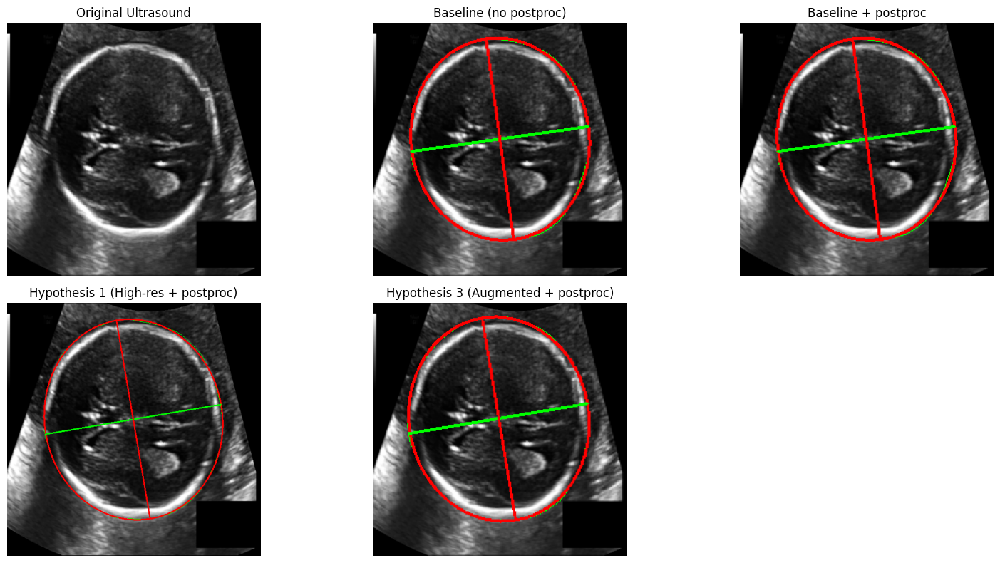

In [44]:
# ============================================================
# FINAL QUALITATIVE VISUALIZATION ACROSS ALL MODELS
# ============================================================

import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Helper to run full pipeline and return visualization image
# ------------------------------------------------------------

def run_full_visual_pipeline(
    model,
    img_path,
    image_size,
    use_postprocessing=False,
    threshold=0.5
):
    # Load image
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = preprocess_image_minimal(img)
    img = resize_image(img, image_size)

    # Predict boundary
    prob = predict_boundary_generic(model, img)
    binary = (prob > threshold).astype(np.uint8)

    if use_postprocessing:
        binary = postprocess_boundary(binary)

    contour = get_largest_contour(binary)
    ellipse = fit_ellipse_to_contour(contour)

    canvas = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

    if contour is not None:
        cv2.drawContours(canvas, [contour], -1, (0, 255, 0), 1)

    if ellipse is not None:
        cv2.ellipse(canvas, ellipse, (255, 0, 0), 2)
        bpd_pts, ofd_pts = extract_bpd_ofd_landmarks(ellipse)

        # BPD
        cv2.line(
            canvas,
            tuple(bpd_pts[0].astype(int)),
            tuple(bpd_pts[1].astype(int)),
            (0, 255, 0),
            2
        )

        # OFD
        cv2.line(
            canvas,
            tuple(ofd_pts[0].astype(int)),
            tuple(ofd_pts[1].astype(int)),
            (255, 0, 0),
            2
        )

    return canvas


# ------------------------------------------------------------
# 2. Pick a validation image
# ------------------------------------------------------------

sample_img_path = random.choice(val_files)
print("Visualizing image:", sample_img_path)

# ------------------------------------------------------------
# 3. Run visualization for all models
# ------------------------------------------------------------

vis_baseline = run_full_visual_pipeline(
    MODEL_REGISTRY["baseline"]["model"],
    sample_img_path,
    MODEL_REGISTRY["baseline"]["image_size"],
    use_postprocessing=False
)

vis_baseline_pp = run_full_visual_pipeline(
    MODEL_REGISTRY["baseline"]["model"],
    sample_img_path,
    MODEL_REGISTRY["baseline"]["image_size"],
    use_postprocessing=True
)

vis_h1 = run_full_visual_pipeline(
    MODEL_REGISTRY["hyp1_highres"]["model"],
    sample_img_path,
    MODEL_REGISTRY["hyp1_highres"]["image_size"],
    use_postprocessing=True
)

vis_h3 = run_full_visual_pipeline(
    MODEL_REGISTRY["hyp3_augmented"]["model"],
    sample_img_path,
    MODEL_REGISTRY["hyp3_augmented"]["image_size"],
    use_postprocessing=True
)

# ------------------------------------------------------------
# 4. Plot side by side
# ------------------------------------------------------------

plt.figure(figsize=(16, 8))

plt.subplot(2, 3, 1)
plt.title("Original Ultrasound")
orig = cv2.imread(sample_img_path, cv2.IMREAD_GRAYSCALE)
plt.imshow(resize_image(normalize_image(orig), IMAGE_SIZE), cmap="gray")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.title("Baseline (no postproc)")
plt.imshow(vis_baseline)
plt.axis("off")

plt.subplot(2, 3, 3)
plt.title("Baseline + postproc")
plt.imshow(vis_baseline_pp)
plt.axis("off")

plt.subplot(2, 3, 4)
plt.title("Hypothesis 1 (High-res + postproc)")
plt.imshow(vis_h1)
plt.axis("off")

plt.subplot(2, 3, 5)
plt.title("Hypothesis 3 (Augmented + postproc)")
plt.imshow(vis_h3)
plt.axis("off")

plt.tight_layout()
plt.show()



Visualizing sample 1: /kaggle/input/taskb-segmen/Task - Segmentation/images/474_HC.png


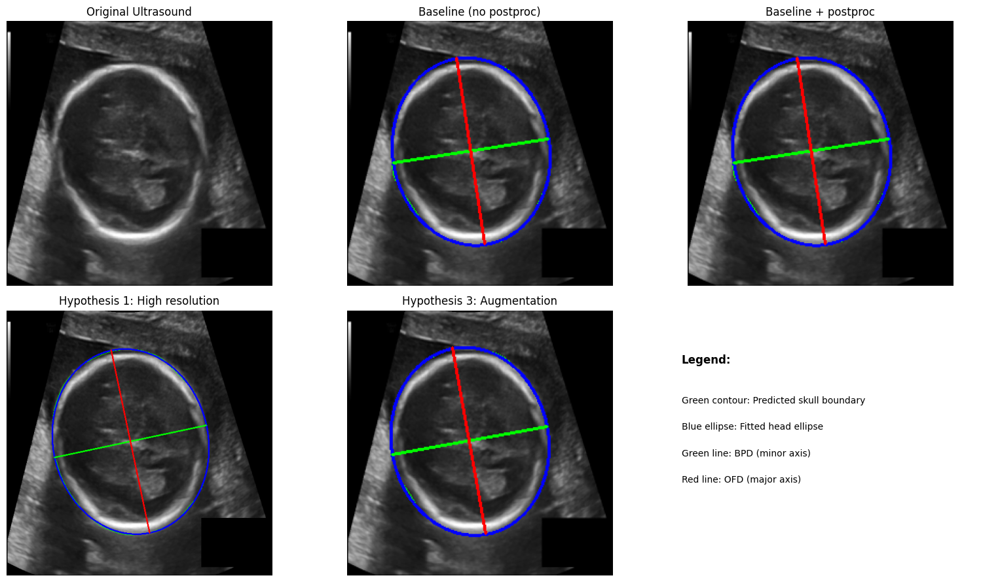


Visualizing sample 2: /kaggle/input/taskb-segmen/Task - Segmentation/images/039_HC.png


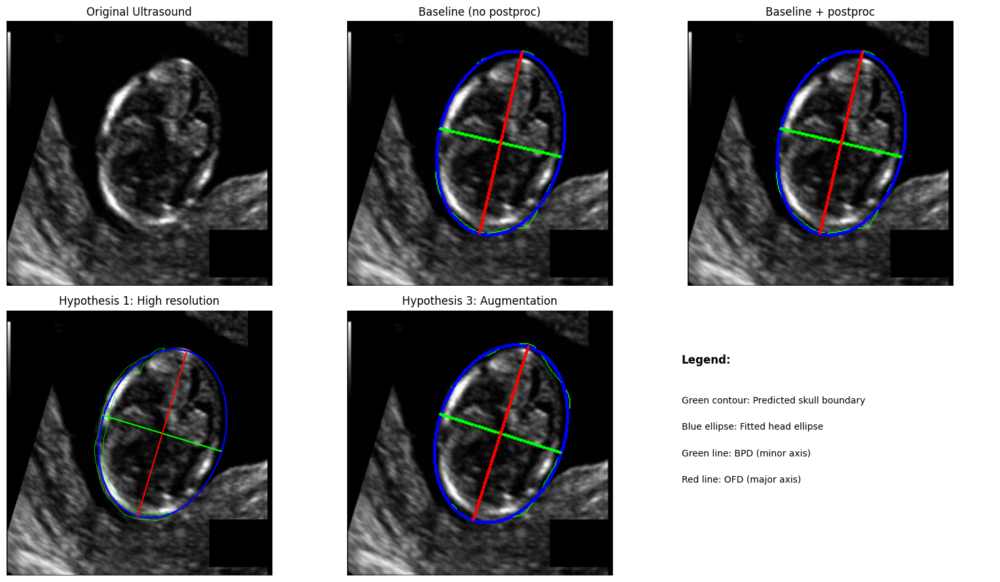


Visualizing sample 3: /kaggle/input/taskb-segmen/Task - Segmentation/images/468_2HC.png


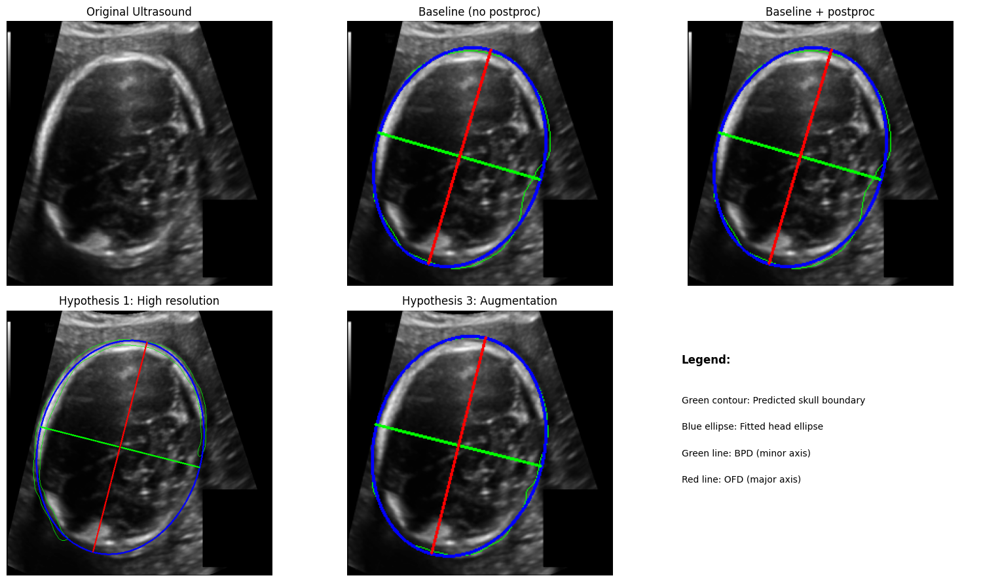

In [45]:
# ============================================================
# FINAL QUALITATIVE VISUALIZATION WITH LEGEND (MULTI-SAMPLE)
# ============================================================

import matplotlib.pyplot as plt
import random

# ------------------------------------------------------------
# 1. Full pipeline with annotated overlay
# ------------------------------------------------------------

def run_full_visual_pipeline_annotated(
    model,
    img_path,
    image_size,
    use_postprocessing=False,
    threshold=0.5
):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = preprocess_image_minimal(img)
    img = resize_image(img, image_size)

    prob = predict_boundary_generic(model, img)
    binary = (prob > threshold).astype(np.uint8)

    if use_postprocessing:
        binary = postprocess_boundary(binary)

    contour = get_largest_contour(binary)
    ellipse = fit_ellipse_to_contour(contour)

    canvas = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)

    if contour is not None:
        cv2.drawContours(canvas, [contour], -1, (0, 255, 0), 1)  # green boundary

    if ellipse is not None:
        cv2.ellipse(canvas, ellipse, (0, 0, 255), 2)  # blue ellipse

        bpd_pts, ofd_pts = extract_bpd_ofd_landmarks(ellipse)

        # BPD (green)
        cv2.line(
            canvas,
            tuple(bpd_pts[0].astype(int)),
            tuple(bpd_pts[1].astype(int)),
            (0, 255, 0),
            2
        )

        # OFD (red)
        cv2.line(
            canvas,
            tuple(ofd_pts[0].astype(int)),
            tuple(ofd_pts[1].astype(int)),
            (255, 0, 0),
            2
        )

    return canvas


# ------------------------------------------------------------
# 2. Visualization over multiple random samples
# ------------------------------------------------------------

NUM_SAMPLES = 3  # increase to 4 or 5 if GPU memory allows
sample_paths = random.sample(val_files, NUM_SAMPLES)

for idx, img_path in enumerate(sample_paths):
    print(f"\nVisualizing sample {idx+1}: {img_path}")

    fig, axes = plt.subplots(2, 3, figsize=(16, 9))

    # Original
    orig = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    orig = resize_image(normalize_image(orig), IMAGE_SIZE)

    axes[0, 0].imshow(orig, cmap="gray")
    axes[0, 0].set_title("Original Ultrasound")
    axes[0, 0].axis("off")

    # Baseline (no postprocessing)
    axes[0, 1].imshow(
        run_full_visual_pipeline_annotated(
            MODEL_REGISTRY["baseline"]["model"],
            img_path,
            MODEL_REGISTRY["baseline"]["image_size"],
            use_postprocessing=False
        )
    )
    axes[0, 1].set_title("Baseline (no postproc)")
    axes[0, 1].axis("off")

    # Baseline + postprocessing
    axes[0, 2].imshow(
        run_full_visual_pipeline_annotated(
            MODEL_REGISTRY["baseline"]["model"],
            img_path,
            MODEL_REGISTRY["baseline"]["image_size"],
            use_postprocessing=True
        )
    )
    axes[0, 2].set_title("Baseline + postproc")
    axes[0, 2].axis("off")

    # Hypothesis 1
    axes[1, 0].imshow(
        run_full_visual_pipeline_annotated(
            MODEL_REGISTRY["hyp1_highres"]["model"],
            img_path,
            MODEL_REGISTRY["hyp1_highres"]["image_size"],
            use_postprocessing=True
        )
    )
    axes[1, 0].set_title("Hypothesis 1: High resolution")
    axes[1, 0].axis("off")

    # Hypothesis 3
    axes[1, 1].imshow(
        run_full_visual_pipeline_annotated(
            MODEL_REGISTRY["hyp3_augmented"]["model"],
            img_path,
            MODEL_REGISTRY["hyp3_augmented"]["image_size"],
            use_postprocessing=True
        )
    )
    axes[1, 1].set_title("Hypothesis 3: Augmentation")
    axes[1, 1].axis("off")

    # Legend panel
    axes[1, 2].axis("off")
    axes[1, 2].text(0.1, 0.8, "Legend:", fontsize=12, weight="bold")
    axes[1, 2].text(0.1, 0.65, "Green contour: Predicted skull boundary", fontsize=10)
    axes[1, 2].text(0.1, 0.55, "Blue ellipse: Fitted head ellipse", fontsize=10)
    axes[1, 2].text(0.1, 0.45, "Green line: BPD (minor axis)", fontsize=10)
    axes[1, 2].text(0.1, 0.35, "Red line: OFD (major axis)", fontsize=10)

    plt.tight_layout()
    plt.show()


In [46]:
import shutil
import os

shutil.make_archive(
    base_name="/kaggle/working/all_outputs_new",
    format="zip",
    root_dir="/kaggle/working"
)


'/kaggle/working/all_outputs_new.zip'